In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0532.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0282.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1401.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0914.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0691.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0972.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0818.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0463.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0930.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1323.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1347.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_1354.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0704.jpg
/kaggle/input/brain-tumor-mri-dataset/Training/pituitary/Tr-pi_0

In [1]:
import os
import time
import csv
import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim.lr_scheduler import OneCycleLR, ReduceLROnPlateau
from transformers import ViTImageProcessor, ViTForImageClassification
from torch.utils.data import DataLoader, Dataset
from torchvision import datasets, transforms
from tqdm import tqdm
import warnings
from transformers.utils import logging
import matplotlib.pyplot as plt

# Tắt toàn bộ cảnh báo
warnings.filterwarnings("ignore")
# Tắt log của thư viện Transformers
logging.set_verbosity_error()

# Helper function to format time
def format_time(seconds):
    hours, remainder = divmod(seconds, 3600)
    minutes, seconds = divmod(remainder, 60)
    return f"{int(hours)}h {int(minutes)}m {int(seconds)}s"

# Define your dataset with enhanced data augmentation
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(p=0.5),  # New: Add random horizontal flip
    transforms.RandomRotation(15),  # New: Add random rotation
    transforms.ColorJitter(brightness=0.2, contrast=0.2),  # New: Add color jitter
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # New: Add normalization
])

val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # New: Add normalization
])

# Load dataset
full_dataset = datasets.ImageFolder(root=os.path.join(data_dir, "Training"), transform=train_transform)
print(f"Danh sách lớp: {full_dataset.classes}")
print(f"Số lượng lớp: {len(full_dataset.classes)}")

2025-05-28 13:55:00.191875: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748440500.639745      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748440500.760223      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Danh sách lớp: ['glioma', 'meningioma', 'notumor', 'pituitary']
Số lượng lớp: 4


In [2]:
# Initialize ViT model
model_name = "google/vit-base-patch16-224"
processor = ViTImageProcessor.from_pretrained(model_name)
model = ViTForImageClassification.from_pretrained(
    model_name,
    num_labels=len(full_dataset.classes),
    ignore_mismatched_sizes=True
)

# Add dropout to the classifier for regularization
model.classifier = nn.Sequential(
    nn.Dropout(0.3),  # New: Add dropout to classifier
    nn.Linear(model.classifier.in_features, model.classifier.out_features)
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Sử dụng thiết bị: {device}")
model = model.to(device)

# Split dataset into train and validation
train_size = int(0.8 * len(full_dataset))
val_size = len(full_dataset) - train_size
train_dataset, val_dataset = torch.utils.data.random_split(full_dataset, [train_size, val_size])

# Apply validation transform to val_dataset
val_dataset.dataset.transform = val_transform

# Create dataloaders
batch_size = 16
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# Test dataloader
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

print(f"📊 Số lượng ảnh train: {len(train_dataset)}")
print(f"📊 Số lượng ảnh validation: {len(val_dataset)}")
print(f"📊 Số lượng ảnh test: {len(test_dataset)}")


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Sử dụng thiết bị: cuda
📊 Số lượng ảnh train: 4569
📊 Số lượng ảnh validation: 1143
📊 Số lượng ảnh test: 1311


Số lượng ảnh trong mỗi lớp của tập train:
glioma: 1042
meningioma: 1095
notumor: 1294
pituitary: 1138


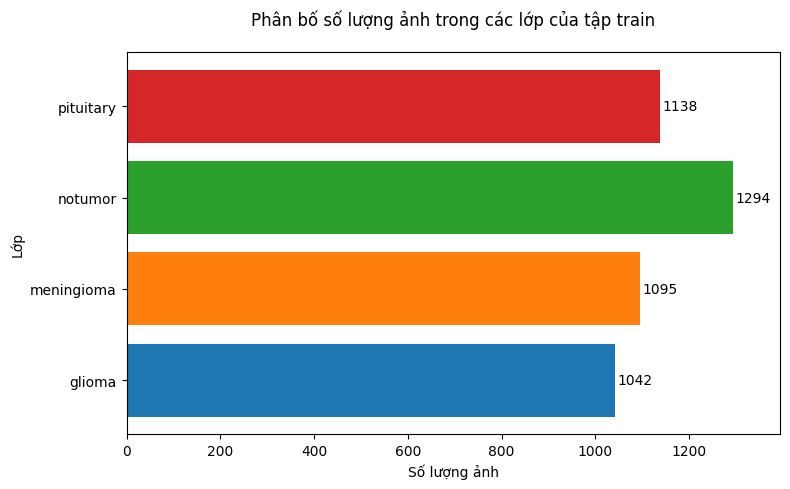

In [3]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Lấy chỉ số của các mẫu trong tập train
train_indices = train_dataset.indices
train_labels = [full_dataset.targets[idx] for idx in train_indices]

# Đếm số lượng ảnh trong mỗi lớp
class_counts = Counter(train_labels)
class_names = full_dataset.classes
counts = [class_counts[i] for i in range(len(class_names))]

# In số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp của tập train:")
for class_name, count in zip(class_names, counts):
    print(f"{class_name}: {count}")

# Tạo danh sách 4 màu khác nhau cho 4 lớp
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Xanh dương, cam, xanh lá, đỏ

# Vẽ biểu đồ cột nằm
plt.figure(figsize=(8, 5))
bars = plt.barh(class_names, counts, color=colors)
plt.xlabel('Số lượng ảnh')
plt.ylabel('Lớp')
plt.title('Phân bố số lượng ảnh trong các lớp của tập train', loc='center', pad=20)

# Thêm số lượng cụ thể ở cuối mỗi cột
max_count = max(counts)
for bar, count in zip(bars, counts):
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, f'{count}', 
             ha='left', va='center', fontsize=10)

# Điều chỉnh giới hạn trục x để tạo thêm không gian cho số
plt.xlim(0, max_count + 100)  # Thêm khoảng trống 100 đơn vị bên phải

plt.tight_layout()

# Lưu biểu đồ
plt.savefig('train_class_distribution_horizontal.png')

In [5]:
from collections import Counter
import random
import torch
from torch.utils.data import Subset

# Hàm để tạo tập dữ liệu cân bằng
def oversample_dataset(dataset, indices):
    # Lấy nhãn của các mẫu trong tập train
    labels = [dataset.dataset.targets[idx] for idx in indices]
    class_counts = Counter(labels)
    class_names = dataset.dataset.classes
    print("Phân bố lớp trước oversampling:")
    for class_idx, count in class_counts.items():
        print(f"{class_names[class_idx]}: {count}")

    # Tìm số lượng mẫu lớn nhất trong một lớp
    max_count = max(class_counts.values())
    print(f"Số lượng mẫu mục tiêu cho mỗi lớp: {max_count}")

    # Tạo danh sách chỉ số mới (bao gồm cả mẫu được sao chép)
    new_indices = []
    for class_idx in range(len(class_names)):
        # Lấy tất cả chỉ số của lớp hiện tại
        class_indices = [idx for idx in indices if dataset.dataset.targets[idx] == class_idx]
        # Số mẫu cần thêm
        samples_to_add = max_count - len(class_indices)
        # Thêm các chỉ số hiện có
        new_indices.extend(class_indices)
        # Sao chép ngẫu nhiên các mẫu từ lớp hiện tại để đạt max_count
        if samples_to_add > 0:
            new_indices.extend(random.choices(class_indices, k=samples_to_add))

    print(f"Tổng số mẫu sau oversampling: {len(new_indices)}")
    return new_indices

# Áp dụng oversampling lên tập train
new_train_indices = oversample_dataset(train_dataset, train_dataset.indices)

# Cập nhật tập train với chỉ số mới
train_dataset = Subset(full_dataset, new_train_indices)

# Tạo lại train_loader (không cần sampler nữa vì dữ liệu đã cân bằng)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

# Kiểm tra phân bố lớp sau oversampling
def check_dataset_distribution(dataset, indices):
    labels = [dataset.dataset.targets[idx] for idx in indices]
    class_counts = Counter(labels)
    print("Phân bố lớp sau oversampling trong tập train:")
    for class_idx, count in class_counts.items():
        print(f"{full_dataset.classes[class_idx]}: {count}")

check_dataset_distribution(train_dataset, new_train_indices)

Phân bố lớp trước oversampling:
notumor: 1262
meningioma: 1072
pituitary: 1171
glioma: 1064
Số lượng mẫu mục tiêu cho mỗi lớp: 1262
Tổng số mẫu sau oversampling: 5048
Phân bố lớp sau oversampling trong tập train:
glioma: 1262
meningioma: 1262
notumor: 1262
pituitary: 1262


Số lượng ảnh trong mỗi lớp của tập train (sau oversampling):
glioma: 1262
meningioma: 1262
notumor: 1262
pituitary: 1262


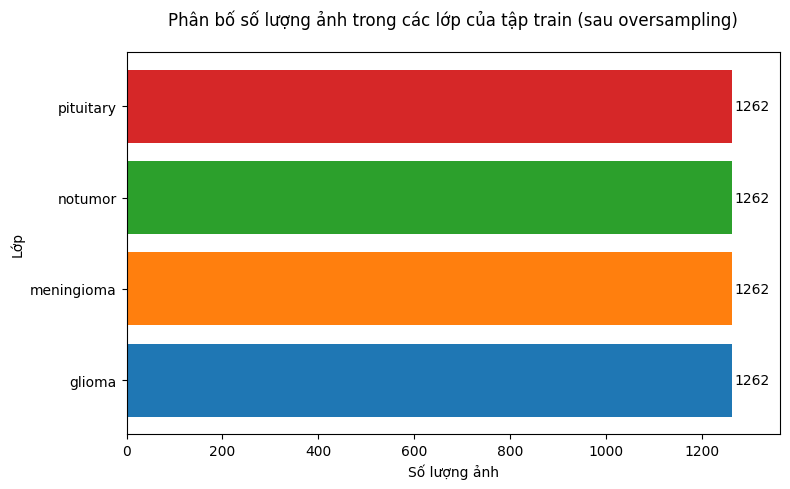

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from collections import Counter

# Lấy chỉ số và nhãn của tập train sau oversampling
train_indices = new_train_indices  # Từ code oversampling trước đó
train_labels = [full_dataset.targets[idx] for idx in train_indices]

# Đếm số lượng ảnh trong mỗi lớp
class_counts = Counter(train_labels)
class_names = full_dataset.classes
counts = [class_counts[i] for i in range(len(class_names))]

# In số lượng ảnh trong mỗi lớp
print("Số lượng ảnh trong mỗi lớp của tập train (sau oversampling):")
for class_name, count in zip(class_names, counts):
    print(f"{class_name}: {count}")

# Tạo danh sách 4 màu khác nhau cho 4 lớp
colors = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']  # Xanh dương, cam, xanh lá, đỏ

# Vẽ biểu đồ cột nằm
plt.figure(figsize=(8, 5))
bars = plt.barh(class_names, counts, color=colors)
plt.xlabel('Số lượng ảnh')
plt.ylabel('Lớp')
plt.title('Phân bố số lượng ảnh trong các lớp của tập train (sau oversampling)', loc='center', pad=20)

# Thêm số lượng cụ thể ở cuối mỗi cột
max_count = max(counts)
for bar, count in zip(bars, counts):
    width = bar.get_width()
    plt.text(width + 5, bar.get_y() + bar.get_height()/2, f'{count}', 
             ha='left', va='center', fontsize=10)

# Điều chỉnh giới hạn trục x để tạo thêm không gian cho số
plt.xlim(0, max_count + 100)  # Thêm khoảng trống 100 đơn vị bên phải

plt.tight_layout()

# Lưu biểu đồ
plt.savefig('train_class_distribution_horizontal_oversampled.png')
plt.show()

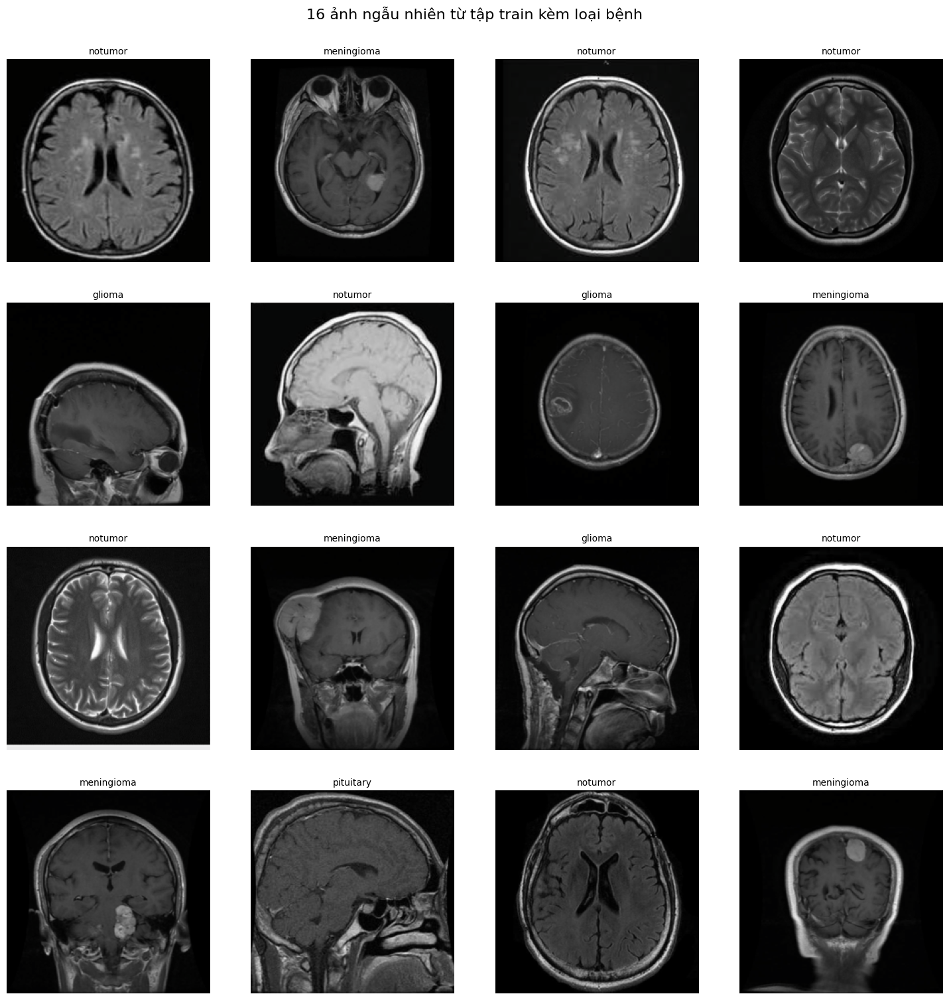

In [3]:
import matplotlib.pyplot as plt
import numpy as np
import random

# Lấy danh sách lớp từ full_dataset
class_names = full_dataset.classes

# Lấy 16 mẫu ngẫu nhiên từ train_dataset
random_indices = random.sample(range(len(train_dataset)), 16)
random_samples = [train_dataset[i] for i in random_indices]

# Tạo lưới 4x4 để hiển thị ảnh
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
axes = axes.flatten()

# Hiển thị từng ảnh và tên loại bệnh
for i, (image, label) in enumerate(random_samples):
    # Chuyển tensor ảnh về định dạng numpy và chuẩn hóa để hiển thị
    image = image.permute(1, 2, 0).numpy()  # Chuyển từ (C, H, W) sang (H, W, C)
    image = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])  # Đảo ngược chuẩn hóa
    image = np.clip(image, 0, 1)  # Đảm bảo giá trị trong khoảng [0, 1]

    # Hiển thị ảnh
    axes[i].imshow(image)
    axes[i].set_title(class_names[label], fontsize=10)
    axes[i].axis('off')  # Tắt trục

plt.suptitle('16 ảnh ngẫu nhiên từ tập train kèm loại bệnh', fontsize=16)
# plt.tight_layout(rect=[0, 0, 1, 0.95])  # Điều chỉnh layout để có chỗ cho tiêu đề
plt.subplots_adjust(left=0.05, right=0.95, top=0.93, bottom=0.05, wspace=0.1, hspace=0.2)  # Điều chỉnh khoảng cách giữa các subplot
plt.show()

In [4]:
# Create save directory
save_dir = "/kaggle/working/tesstvikt"
os.makedirs(save_dir, exist_ok=True)

In [5]:
# Freeze most layers and unfreeze more layers for fine-tuning
for param in model.vit.parameters():
    param.requires_grad = False

# Unfreeze the last 6 layers (out of 12) instead of 4
for i, layer in enumerate(model.vit.encoder.layer):
    if i >= 6:  # Modified: Unfreeze from layer 6 onward
        for param in layer.parameters():
            param.requires_grad = True

# Unfreeze classifier
for param in model.classifier.parameters():
    param.requires_grad = True

# Move model to device
model.to(device)

# Loss function with reduced label smoothing
criterion = nn.CrossEntropyLoss(label_smoothing=0.0)  # Modified: Remove label smoothing

# Adjusted learning rates - slightly higher
optimizer = optim.AdamW([
    {'params': [p for i, layer in enumerate(model.vit.encoder.layer) if i >= 6 for p in layer.parameters()], 'lr': 1e-5},  # Modified: Increased LR
    {'params': model.classifier.parameters(), 'lr': 3e-5}  # Modified: Increased LR
], weight_decay=0.04)

# Optimized learning rate scheduler
scheduler = OneCycleLR(
    optimizer, 
    max_lr=[1e-5, 3e-5],  # Modified: Increased max_lr
    steps_per_epoch=len(train_loader),
    epochs=300,  # Modified: Increased to 300 epochs
    pct_start=0.2,
    div_factor=25,
    final_div_factor=3000,
    anneal_strategy='cos'
)

# New: Add ReduceLROnPlateau scheduler for dynamic LR adjustment
scheduler_plateau = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# Training parameters
num_epochs = 200  # Modified: Increased to 300 epochs
best_val_acc = 0
patience = 30  # Modified: Increased patience to 30
patience_counter = 0
best_val_loss = float('inf')
train_losses, val_losses = [], []
train_accuracies, val_accuracies = [], []
start_total_time = time.time()

# Gradient accumulation steps - increased to simulate larger batch size
accumulation_steps = 4  # Modified: Increased to 4 (effective batch size = 64)

# Training loop
for epoch in range(num_epochs):
    start_time = time.time()

    # Training phase
    model.train()
    train_loss, train_correct, train_total = 0, 0, 0
    progress_bar = tqdm(enumerate(train_loader), total=len(train_loader),
                       desc=f"Epoch {epoch+1}/{num_epochs}")

    optimizer.zero_grad()
    
    for batch_idx, (images, labels) in progress_bar:
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = model(images).logits
        loss = criterion(outputs, labels)
        
        # Normalize loss for gradient accumulation
        loss = loss / accumulation_steps
        loss.backward()
        
        # Update weights every accumulation_steps batches
        if (batch_idx + 1) % accumulation_steps == 0 or (batch_idx + 1) == len(train_loader):
            torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=0.5)
            optimizer.step()
            scheduler.step()  # Update learning rate
            optimizer.zero_grad()
        
        # Track metrics
        train_loss += loss.item() * accumulation_steps
        _, predicted = torch.max(outputs, 1)
        train_correct += (predicted == labels).sum().item()
        train_total += labels.size(0)

        progress_bar.set_postfix(
            loss=loss.item() * accumulation_steps,
            acc=f"{100 * train_correct / train_total:.2f}%"
        )
    
    avg_train_loss = train_loss / len(train_loader)

    # Validation phase
    model.eval()
    val_loss, val_correct, val_total = 0, 0, 0

    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images).logits
            loss = criterion(outputs, labels)

            val_loss += loss.item()
            _, predicted = torch.max(outputs, 1)
            val_correct += (predicted == labels).sum().item()
            val_total += labels.size(0)

    # Calculate average metrics
    train_loss = avg_train_loss
    train_acc = 100 * train_correct / train_total
    val_loss /= len(val_loader)
    val_acc = 100 * val_correct / val_total

    # Update ReduceLROnPlateau scheduler
    scheduler_plateau.step(val_loss)  # New: Adjust LR based on val_loss

    # Save metrics
    train_losses.append(train_loss)
    train_accuracies.append(train_acc)
    val_losses.append(val_loss)
    val_accuracies.append(val_acc)

    elapsed_time = format_time(time.time() - start_time)
    print(f"Epoch [{epoch+1}/{num_epochs}] ━ "
          f"Train Loss: {train_loss:.4f} ━ "
          f"Train Acc: {train_acc:.2f}% ━ "
          f"Val Loss: {val_loss:.4f} ━ "
          f"Val Acc: {val_acc:.2f}% ━ "
          f"Time: {elapsed_time}")
    
    # Check if we've reached target loss
    if val_loss <= 0.1:  # Modified: Updated target to 0.1
        print(f"🎯 Target loss of 0.1 reached at epoch {epoch+1}!")
        model_path = os.path.join(save_dir, "vit_model_target_reached.pth")
        torch.save(model.state_dict(), model_path)
        print(f"💾 Model saved at {model_path} with val_loss {val_loss:.4f}")
        
    # Save best model based on validation accuracy
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        model_path = os.path.join(save_dir, "vit_model_best_acc.pth")
        torch.save(model.state_dict(), model_path)
        print(f"✅ Model saved at {model_path} with val_acc {val_acc:.2f}%")
    
    # Save best model based on validation loss
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        patience_counter = 0
        model_path = os.path.join(save_dir, "vit_model_best_loss.pth")
        torch.save(model.state_dict(), model_path)
        print(f"📉 Model saved at {model_path} with val_loss {val_loss:.4f}")
    else:
        patience_counter += 1
    
    # Early stopping check
    if patience_counter >= patience:
        print(f"⚠️ Early stopping triggered after {patience} epochs without improvement")
        break

    # Save checkpoint every 10 epochs
    if (epoch + 1) % 10 == 0:
        checkpoint_path = os.path.join(save_dir, f"vit_model_epoch_{epoch+1}.pth")
        torch.save({
            'epoch': epoch + 1,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'train_loss': train_loss,
            'val_loss': val_loss,
            'train_acc': train_acc,
            'val_acc': val_acc
        }, checkpoint_path)
        print(f"📌 Checkpoint saved at {checkpoint_path}")

# Save final model
final_model_path = os.path.join(save_dir, "vit_model_final.pth")
torch.save(model.state_dict(), final_model_path)
print(f"🏁 Final model saved at {final_model_path}")

# Save training time
total_train_time = time.time() - start_total_time
train_time_path = os.path.join(save_dir, "vit_train_time.txt")
with open(train_time_path, "w") as f:
    f.write(f"Total Training Time: {format_time(total_train_time)}\n")
    f.write(f"Best validation accuracy: {best_val_acc:.2f}%\n")
    f.write(f"Best validation loss: {best_val_loss:.4f}\n")
    f.write(f"Final validation accuracy: {val_acc:.2f}%\n")
    f.write(f"Final validation loss: {val_loss:.4f}\n")
print(f"🕒 Total training time: {format_time(total_train_time)}")

# Save training log
csv_path = os.path.join(save_dir, "vit_training_log.csv")
with open(csv_path, "w", newline="") as csvfile:
    csvwriter = csv.writer(csvfile)
    csvwriter.writerow(["Epoch", "Train Loss", "Train Accuracy", "Val Loss", "Val Accuracy"])
    for epoch_idx in range(len(train_losses)):
        csvwriter.writerow([
            epoch_idx+1,
            train_losses[epoch_idx],
            train_accuracies[epoch_idx],
            val_losses[epoch_idx],
            val_accuracies[epoch_idx]
        ])
print(f"📊 Training log saved to {csv_path}")

Epoch 1/200: 100%|██████████| 286/286 [02:10<00:00,  2.19it/s, acc=33.71%, loss=1.35]


Epoch [1/200] ━ Train Loss: 1.3366 ━ Train Acc: 33.71% ━ Val Loss: 1.2533 ━ Val Acc: 42.08% ━ Time: 0h 2m 32s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 42.08%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 1.2533


Epoch 2/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=40.60%, loss=1.15] 


Epoch [2/200] ━ Train Loss: 1.2665 ━ Train Acc: 40.60% ━ Val Loss: 1.1811 ━ Val Acc: 51.79% ━ Time: 0h 2m 23s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 51.79%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 1.1811


Epoch 3/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=47.41%, loss=1.26] 


Epoch [3/200] ━ Train Loss: 1.1948 ━ Train Acc: 47.41% ━ Val Loss: 1.1147 ━ Val Acc: 60.19% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 60.19%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 1.1147


Epoch 4/200: 100%|██████████| 286/286 [02:03<00:00,  2.31it/s, acc=54.13%, loss=0.961]


Epoch [4/200] ━ Train Loss: 1.1214 ━ Train Acc: 54.13% ━ Val Loss: 1.0499 ━ Val Acc: 67.54% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 67.54%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 1.0499


Epoch 5/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=60.14%, loss=0.996]


Epoch [5/200] ━ Train Loss: 1.0517 ━ Train Acc: 60.14% ━ Val Loss: 0.9880 ━ Val Acc: 71.04% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 71.04%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.9880


Epoch 6/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=65.18%, loss=1.15] 


Epoch [6/200] ━ Train Loss: 0.9873 ━ Train Acc: 65.18% ━ Val Loss: 0.9282 ━ Val Acc: 74.19% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 74.19%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.9282


Epoch 7/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=68.92%, loss=1]    


Epoch [7/200] ━ Train Loss: 0.9238 ━ Train Acc: 68.92% ━ Val Loss: 0.8708 ━ Val Acc: 76.29% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 76.29%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.8708


Epoch 8/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=72.47%, loss=0.835]


Epoch [8/200] ━ Train Loss: 0.8662 ━ Train Acc: 72.47% ━ Val Loss: 0.8141 ━ Val Acc: 77.95% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 77.95%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.8141


Epoch 9/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=74.50%, loss=0.939]


Epoch [9/200] ━ Train Loss: 0.8102 ━ Train Acc: 74.50% ━ Val Loss: 0.7599 ━ Val Acc: 79.09% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 79.09%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.7599


Epoch 10/200: 100%|██████████| 286/286 [02:07<00:00,  2.24it/s, acc=77.46%, loss=0.694]


Epoch [10/200] ━ Train Loss: 0.7500 ━ Train Acc: 77.46% ━ Val Loss: 0.7107 ━ Val Acc: 81.10% ━ Time: 0h 2m 25s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 81.10%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.7107
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_10.pth


Epoch 11/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=79.49%, loss=1.07] 


Epoch [11/200] ━ Train Loss: 0.7044 ━ Train Acc: 79.49% ━ Val Loss: 0.6651 ━ Val Acc: 82.50% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 82.50%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.6651


Epoch 12/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=81.97%, loss=0.471]


Epoch [12/200] ━ Train Loss: 0.6491 ━ Train Acc: 81.97% ━ Val Loss: 0.6232 ━ Val Acc: 83.64% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 83.64%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.6232


Epoch 13/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=82.47%, loss=0.547]


Epoch [13/200] ━ Train Loss: 0.6159 ━ Train Acc: 82.47% ━ Val Loss: 0.5846 ━ Val Acc: 83.81% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 83.81%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.5846


Epoch 14/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=84.00%, loss=0.601]


Epoch [14/200] ━ Train Loss: 0.5720 ━ Train Acc: 84.00% ━ Val Loss: 0.5491 ━ Val Acc: 85.04% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 85.04%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.5491


Epoch 15/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=85.71%, loss=0.567]


Epoch [15/200] ━ Train Loss: 0.5324 ━ Train Acc: 85.71% ━ Val Loss: 0.5175 ━ Val Acc: 85.39% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 85.39%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.5175


Epoch 16/200: 100%|██████████| 286/286 [02:04<00:00,  2.31it/s, acc=86.28%, loss=0.413]


Epoch [16/200] ━ Train Loss: 0.4981 ━ Train Acc: 86.28% ━ Val Loss: 0.4878 ━ Val Acc: 85.91% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 85.91%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.4878


Epoch 17/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=87.07%, loss=0.44] 


Epoch [17/200] ━ Train Loss: 0.4678 ━ Train Acc: 87.07% ━ Val Loss: 0.4614 ━ Val Acc: 86.79% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 86.79%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.4614


Epoch 18/200: 100%|██████████| 286/286 [02:06<00:00,  2.26it/s, acc=87.79%, loss=0.377]


Epoch [18/200] ━ Train Loss: 0.4437 ━ Train Acc: 87.79% ━ Val Loss: 0.4366 ━ Val Acc: 87.05% ━ Time: 0h 2m 24s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 87.05%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.4366


Epoch 19/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=87.59%, loss=0.579]


Epoch [19/200] ━ Train Loss: 0.4163 ━ Train Acc: 87.59% ━ Val Loss: 0.4148 ━ Val Acc: 87.40% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 87.40%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.4148


Epoch 20/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=89.03%, loss=0.656]


Epoch [20/200] ━ Train Loss: 0.3933 ━ Train Acc: 89.03% ━ Val Loss: 0.3948 ━ Val Acc: 88.01% ━ Time: 0h 2m 23s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 88.01%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.3948
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_20.pth


Epoch 21/200: 100%|██████████| 286/286 [02:06<00:00,  2.25it/s, acc=89.95%, loss=0.218]


Epoch [21/200] ━ Train Loss: 0.3700 ━ Train Acc: 89.95% ━ Val Loss: 0.3754 ━ Val Acc: 88.63% ━ Time: 0h 2m 24s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 88.63%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.3754


Epoch 22/200: 100%|██████████| 286/286 [02:05<00:00,  2.27it/s, acc=90.00%, loss=0.163]


Epoch [22/200] ━ Train Loss: 0.3514 ━ Train Acc: 90.00% ━ Val Loss: 0.3597 ━ Val Acc: 88.54% ━ Time: 0h 2m 23s
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.3597


Epoch 23/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=89.95%, loss=0.193] 


Epoch [23/200] ━ Train Loss: 0.3347 ━ Train Acc: 89.95% ━ Val Loss: 0.3421 ━ Val Acc: 89.41% ━ Time: 0h 2m 23s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 89.41%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.3421


Epoch 24/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=90.85%, loss=0.212]


Epoch [24/200] ━ Train Loss: 0.3183 ━ Train Acc: 90.85% ━ Val Loss: 0.3267 ━ Val Acc: 89.68% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 89.68%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.3267


Epoch 25/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=90.87%, loss=0.423]


Epoch [25/200] ━ Train Loss: 0.3029 ━ Train Acc: 90.87% ━ Val Loss: 0.3133 ━ Val Acc: 89.94% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 89.94%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.3133


Epoch 26/200: 100%|██████████| 286/286 [02:03<00:00,  2.31it/s, acc=91.73%, loss=0.359] 


Epoch [26/200] ━ Train Loss: 0.2828 ━ Train Acc: 91.73% ━ Val Loss: 0.2993 ━ Val Acc: 90.38% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 90.38%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2993


Epoch 27/200: 100%|██████████| 286/286 [02:03<00:00,  2.31it/s, acc=92.14%, loss=0.189] 


Epoch [27/200] ━ Train Loss: 0.2667 ━ Train Acc: 92.14% ━ Val Loss: 0.2868 ━ Val Acc: 90.64% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 90.64%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2868


Epoch 28/200: 100%|██████████| 286/286 [02:04<00:00,  2.31it/s, acc=92.19%, loss=0.227] 


Epoch [28/200] ━ Train Loss: 0.2560 ━ Train Acc: 92.19% ━ Val Loss: 0.2741 ━ Val Acc: 91.08% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 91.08%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2741


Epoch 29/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=92.71%, loss=0.0932]


Epoch [29/200] ━ Train Loss: 0.2410 ━ Train Acc: 92.71% ━ Val Loss: 0.2627 ━ Val Acc: 91.60% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 91.60%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2627


Epoch 30/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=93.39%, loss=0.305] 


Epoch [30/200] ━ Train Loss: 0.2267 ━ Train Acc: 93.39% ━ Val Loss: 0.2507 ━ Val Acc: 92.04% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 92.04%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2507
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_30.pth


Epoch 31/200: 100%|██████████| 286/286 [02:04<00:00,  2.31it/s, acc=93.87%, loss=0.134] 


Epoch [31/200] ━ Train Loss: 0.2137 ━ Train Acc: 93.87% ━ Val Loss: 0.2409 ━ Val Acc: 92.13% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 92.13%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2409


Epoch 32/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=93.94%, loss=0.27]  


Epoch [32/200] ━ Train Loss: 0.2026 ━ Train Acc: 93.94% ━ Val Loss: 0.2291 ━ Val Acc: 92.74% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 92.74%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2291


Epoch 33/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=94.38%, loss=0.37]  


Epoch [33/200] ━ Train Loss: 0.1926 ━ Train Acc: 94.38% ━ Val Loss: 0.2195 ━ Val Acc: 92.83% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 92.83%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2195


Epoch 34/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=94.88%, loss=0.34]  


Epoch [34/200] ━ Train Loss: 0.1803 ━ Train Acc: 94.88% ━ Val Loss: 0.2096 ━ Val Acc: 93.26% ━ Time: 0h 2m 23s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 93.26%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2096


Epoch 35/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=95.16%, loss=0.259] 


Epoch [35/200] ━ Train Loss: 0.1712 ━ Train Acc: 95.16% ━ Val Loss: 0.2013 ━ Val Acc: 93.26% ━ Time: 0h 2m 23s
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.2013


Epoch 36/200: 100%|██████████| 286/286 [02:06<00:00,  2.26it/s, acc=95.32%, loss=0.111] 


Epoch [36/200] ━ Train Loss: 0.1604 ━ Train Acc: 95.32% ━ Val Loss: 0.1919 ━ Val Acc: 93.44% ━ Time: 0h 2m 23s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 93.44%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1919


Epoch 37/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=95.67%, loss=0.0931]


Epoch [37/200] ━ Train Loss: 0.1546 ━ Train Acc: 95.67% ━ Val Loss: 0.1844 ━ Val Acc: 93.70% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 93.70%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1844


Epoch 38/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=96.37%, loss=0.0892]


Epoch [38/200] ━ Train Loss: 0.1407 ━ Train Acc: 96.37% ━ Val Loss: 0.1761 ━ Val Acc: 94.23% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 94.23%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1761


Epoch 39/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=96.28%, loss=0.443] 


Epoch [39/200] ━ Train Loss: 0.1335 ━ Train Acc: 96.28% ━ Val Loss: 0.1684 ━ Val Acc: 94.49% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 94.49%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1684


Epoch 40/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=96.70%, loss=0.126] 


Epoch [40/200] ━ Train Loss: 0.1247 ━ Train Acc: 96.70% ━ Val Loss: 0.1609 ━ Val Acc: 95.01% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 95.01%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1609
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_40.pth


Epoch 41/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=97.29%, loss=0.0457]


Epoch [41/200] ━ Train Loss: 0.1139 ━ Train Acc: 97.29% ━ Val Loss: 0.1548 ━ Val Acc: 95.36% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 95.36%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1548


Epoch 42/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=97.29%, loss=0.374] 


Epoch [42/200] ━ Train Loss: 0.1105 ━ Train Acc: 97.29% ━ Val Loss: 0.1473 ━ Val Acc: 95.98% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 95.98%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1473


Epoch 43/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=97.66%, loss=0.0325]


Epoch [43/200] ━ Train Loss: 0.0970 ━ Train Acc: 97.66% ━ Val Loss: 0.1425 ━ Val Acc: 95.45% ━ Time: 0h 2m 22s
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1425


Epoch 44/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=97.75%, loss=0.0898]


Epoch [44/200] ━ Train Loss: 0.0923 ━ Train Acc: 97.75% ━ Val Loss: 0.1355 ━ Val Acc: 95.89% ━ Time: 0h 2m 22s
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1355


Epoch 45/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=98.23%, loss=0.0934]


Epoch [45/200] ━ Train Loss: 0.0838 ━ Train Acc: 98.23% ━ Val Loss: 0.1296 ━ Val Acc: 96.06% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 96.06%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1296


Epoch 46/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=98.05%, loss=0.0177]


Epoch [46/200] ━ Train Loss: 0.0785 ━ Train Acc: 98.05% ━ Val Loss: 0.1244 ━ Val Acc: 96.15% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 96.15%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1244


Epoch 47/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=98.40%, loss=0.0911]


Epoch [47/200] ━ Train Loss: 0.0732 ━ Train Acc: 98.40% ━ Val Loss: 0.1185 ━ Val Acc: 96.33% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 96.33%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1185


Epoch 48/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=98.56%, loss=0.173]  


Epoch [48/200] ━ Train Loss: 0.0662 ━ Train Acc: 98.56% ━ Val Loss: 0.1134 ━ Val Acc: 96.68% ━ Time: 0h 2m 22s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 96.68%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1134


Epoch 49/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=98.71%, loss=0.157]  


Epoch [49/200] ━ Train Loss: 0.0614 ━ Train Acc: 98.71% ━ Val Loss: 0.1120 ━ Val Acc: 96.15% ━ Time: 0h 2m 22s
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1120


Epoch 50/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=98.80%, loss=0.0244] 


Epoch [50/200] ━ Train Loss: 0.0546 ━ Train Acc: 98.80% ━ Val Loss: 0.1030 ━ Val Acc: 96.76% ━ Time: 0h 2m 21s
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 96.76%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.1030
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_50.pth


Epoch 51/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.08%, loss=0.02]   


Epoch [51/200] ━ Train Loss: 0.0485 ━ Train Acc: 99.08% ━ Val Loss: 0.0994 ━ Val Acc: 96.76% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 51!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0994
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0994


Epoch 52/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=98.97%, loss=0.021]  


Epoch [52/200] ━ Train Loss: 0.0451 ━ Train Acc: 98.97% ━ Val Loss: 0.0944 ━ Val Acc: 97.03% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 52!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0944
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 97.03%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0944


Epoch 53/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.30%, loss=0.0187] 


Epoch [53/200] ━ Train Loss: 0.0388 ━ Train Acc: 99.30% ━ Val Loss: 0.0903 ━ Val Acc: 96.94% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 53!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0903
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0903


Epoch 54/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.32%, loss=0.00646]


Epoch [54/200] ━ Train Loss: 0.0357 ━ Train Acc: 99.32% ━ Val Loss: 0.0859 ━ Val Acc: 97.03% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 54!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0859
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0859


Epoch 55/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=99.41%, loss=0.0161] 


Epoch [55/200] ━ Train Loss: 0.0317 ━ Train Acc: 99.41% ━ Val Loss: 0.0854 ━ Val Acc: 97.11% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 55!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0854
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 97.11%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0854


Epoch 56/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.45%, loss=0.0271] 


Epoch [56/200] ━ Train Loss: 0.0284 ━ Train Acc: 99.45% ━ Val Loss: 0.0775 ━ Val Acc: 97.55% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 56!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0775
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 97.55%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0775


Epoch 57/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.56%, loss=0.029]  


Epoch [57/200] ━ Train Loss: 0.0250 ━ Train Acc: 99.56% ━ Val Loss: 0.0774 ━ Val Acc: 97.38% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 57!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0774
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0774


Epoch 58/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.63%, loss=0.0288] 


Epoch [58/200] ━ Train Loss: 0.0219 ━ Train Acc: 99.63% ━ Val Loss: 0.0700 ━ Val Acc: 97.73% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 58!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0700
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 97.73%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0700


Epoch 59/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.74%, loss=0.00495]


Epoch [59/200] ━ Train Loss: 0.0190 ━ Train Acc: 99.74% ━ Val Loss: 0.0665 ━ Val Acc: 97.99% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 59!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0665
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 97.99%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0665


Epoch 60/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.78%, loss=0.00208]


Epoch [60/200] ━ Train Loss: 0.0165 ━ Train Acc: 99.78% ━ Val Loss: 0.0664 ━ Val Acc: 97.81% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 60!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0664
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0664
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_60.pth


Epoch 61/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.76%, loss=0.00631]


Epoch [61/200] ━ Train Loss: 0.0149 ━ Train Acc: 99.76% ━ Val Loss: 0.0631 ━ Val Acc: 98.08% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 61!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0631
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 98.08%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0631


Epoch 62/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.80%, loss=0.00201]


Epoch [62/200] ━ Train Loss: 0.0121 ━ Train Acc: 99.80% ━ Val Loss: 0.0643 ━ Val Acc: 97.81% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 62!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0643


Epoch 63/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.85%, loss=0.00664]


Epoch [63/200] ━ Train Loss: 0.0112 ━ Train Acc: 99.85% ━ Val Loss: 0.0614 ━ Val Acc: 98.08% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 63!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0614
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0614


Epoch 64/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.89%, loss=0.00586]


Epoch [64/200] ━ Train Loss: 0.0088 ━ Train Acc: 99.89% ━ Val Loss: 0.0596 ━ Val Acc: 98.08% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 64!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0596
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0596


Epoch 65/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.91%, loss=0.0061]  


Epoch [65/200] ━ Train Loss: 0.0078 ━ Train Acc: 99.91% ━ Val Loss: 0.0583 ━ Val Acc: 98.08% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 65!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0583
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0583


Epoch 66/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.96%, loss=0.00137]


Epoch [66/200] ━ Train Loss: 0.0068 ━ Train Acc: 99.96% ━ Val Loss: 0.0590 ━ Val Acc: 97.99% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 66!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0590


Epoch 67/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.96%, loss=0.0018]   


Epoch [67/200] ━ Train Loss: 0.0061 ━ Train Acc: 99.96% ━ Val Loss: 0.0561 ━ Val Acc: 98.43% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 67!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0561
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 98.43%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0561


Epoch 68/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.98%, loss=0.00633]  


Epoch [68/200] ━ Train Loss: 0.0050 ━ Train Acc: 99.98% ━ Val Loss: 0.0552 ━ Val Acc: 98.25% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 68!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0552
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0552


Epoch 69/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.98%, loss=0.00312]  


Epoch [69/200] ━ Train Loss: 0.0044 ━ Train Acc: 99.98% ━ Val Loss: 0.0554 ━ Val Acc: 98.25% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 69!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0554


Epoch 70/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.98%, loss=0.00148]  


Epoch [70/200] ━ Train Loss: 0.0038 ━ Train Acc: 99.98% ━ Val Loss: 0.0587 ━ Val Acc: 98.16% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 70!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0587
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_70.pth


Epoch 71/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=99.98%, loss=0.0028]   


Epoch [71/200] ━ Train Loss: 0.0037 ━ Train Acc: 99.98% ━ Val Loss: 0.0541 ━ Val Acc: 98.34% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 71!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0541
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0541


Epoch 72/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.98%, loss=0.00266]  


Epoch [72/200] ━ Train Loss: 0.0030 ━ Train Acc: 99.98% ━ Val Loss: 0.0535 ━ Val Acc: 98.51% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 72!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0535
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 98.51%
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0535


Epoch 73/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=99.98%, loss=0.0019]  


Epoch [73/200] ━ Train Loss: 0.0025 ━ Train Acc: 99.98% ━ Val Loss: 0.0540 ━ Val Acc: 98.34% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 73!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0540


Epoch 74/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=99.98%, loss=0.000426] 


Epoch [74/200] ━ Train Loss: 0.0023 ━ Train Acc: 99.98% ━ Val Loss: 0.0555 ━ Val Acc: 98.34% ━ Time: 0h 2m 23s
🎯 Target loss of 0.1 reached at epoch 74!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0555


Epoch 75/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=99.98%, loss=0.00235]  


Epoch [75/200] ━ Train Loss: 0.0020 ━ Train Acc: 99.98% ━ Val Loss: 0.0505 ━ Val Acc: 98.43% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 75!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0505
📉 Model saved at /kaggle/working/tesstvikt/vit_model_best_loss.pth with val_loss 0.0505


Epoch 76/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=99.98%, loss=0.000729] 


Epoch [76/200] ━ Train Loss: 0.0019 ━ Train Acc: 99.98% ━ Val Loss: 0.0551 ━ Val Acc: 98.34% ━ Time: 0h 2m 23s
🎯 Target loss of 0.1 reached at epoch 76!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0551


Epoch 77/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=0.00139] 


Epoch [77/200] ━ Train Loss: 0.0016 ━ Train Acc: 100.00% ━ Val Loss: 0.0526 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 77!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0526


Epoch 78/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000401]


Epoch [78/200] ━ Train Loss: 0.0014 ━ Train Acc: 100.00% ━ Val Loss: 0.0547 ━ Val Acc: 98.16% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 78!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0547


Epoch 79/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.000661]


Epoch [79/200] ━ Train Loss: 0.0014 ━ Train Acc: 100.00% ━ Val Loss: 0.0525 ━ Val Acc: 98.60% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 79!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0525
✅ Model saved at /kaggle/working/tesstvikt/vit_model_best_acc.pth with val_acc 98.60%


Epoch 80/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.000529]


Epoch [80/200] ━ Train Loss: 0.0012 ━ Train Acc: 100.00% ━ Val Loss: 0.0517 ━ Val Acc: 98.60% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 80!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0517
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_80.pth


Epoch 81/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.00229] 


Epoch [81/200] ━ Train Loss: 0.0012 ━ Train Acc: 100.00% ━ Val Loss: 0.0506 ━ Val Acc: 98.60% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 81!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0506


Epoch 82/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.000713]


Epoch [82/200] ━ Train Loss: 0.0009 ━ Train Acc: 100.00% ━ Val Loss: 0.0528 ━ Val Acc: 98.43% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 82!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0528


Epoch 83/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.00418] 


Epoch [83/200] ━ Train Loss: 0.0009 ━ Train Acc: 100.00% ━ Val Loss: 0.0519 ━ Val Acc: 98.51% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 83!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0519


Epoch 84/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000419]


Epoch [84/200] ━ Train Loss: 0.0008 ━ Train Acc: 100.00% ━ Val Loss: 0.0514 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 84!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0514


Epoch 85/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.000291]


Epoch [85/200] ━ Train Loss: 0.0008 ━ Train Acc: 100.00% ━ Val Loss: 0.0533 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 85!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0533


Epoch 86/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=0.000607]


Epoch [86/200] ━ Train Loss: 0.0007 ━ Train Acc: 100.00% ━ Val Loss: 0.0523 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 86!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0523


Epoch 87/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.000264]


Epoch [87/200] ━ Train Loss: 0.0006 ━ Train Acc: 100.00% ━ Val Loss: 0.0524 ━ Val Acc: 98.51% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 87!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0524


Epoch 88/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=0.00067] 


Epoch [88/200] ━ Train Loss: 0.0006 ━ Train Acc: 100.00% ━ Val Loss: 0.0530 ━ Val Acc: 98.25% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 88!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0530


Epoch 89/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000689]


Epoch [89/200] ━ Train Loss: 0.0005 ━ Train Acc: 100.00% ━ Val Loss: 0.0528 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 89!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0528


Epoch 90/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000701]


Epoch [90/200] ━ Train Loss: 0.0005 ━ Train Acc: 100.00% ━ Val Loss: 0.0541 ━ Val Acc: 98.34% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 90!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0541
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_90.pth


Epoch 91/200: 100%|██████████| 286/286 [02:05<00:00,  2.29it/s, acc=100.00%, loss=0.000237]


Epoch [91/200] ━ Train Loss: 0.0005 ━ Train Acc: 100.00% ━ Val Loss: 0.0526 ━ Val Acc: 98.51% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 91!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0526


Epoch 92/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.000334]


Epoch [92/200] ━ Train Loss: 0.0005 ━ Train Acc: 100.00% ━ Val Loss: 0.0537 ━ Val Acc: 98.43% ━ Time: 0h 2m 21s
🎯 Target loss of 0.1 reached at epoch 92!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0537


Epoch 93/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000266]


Epoch [93/200] ━ Train Loss: 0.0004 ━ Train Acc: 100.00% ━ Val Loss: 0.0536 ━ Val Acc: 98.51% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 93!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0536


Epoch 94/200: 100%|██████████| 286/286 [02:04<00:00,  2.30it/s, acc=100.00%, loss=0.000144]


Epoch [94/200] ━ Train Loss: 0.0004 ━ Train Acc: 100.00% ━ Val Loss: 0.0536 ━ Val Acc: 98.51% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 94!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0536


Epoch 95/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000207]


Epoch [95/200] ━ Train Loss: 0.0004 ━ Train Acc: 100.00% ━ Val Loss: 0.0542 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 95!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0542


Epoch 96/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=0.000246]


Epoch [96/200] ━ Train Loss: 0.0003 ━ Train Acc: 100.00% ━ Val Loss: 0.0543 ━ Val Acc: 98.43% ━ Time: 0h 2m 23s
🎯 Target loss of 0.1 reached at epoch 96!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0543


Epoch 97/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=0.000186]


Epoch [97/200] ━ Train Loss: 0.0003 ━ Train Acc: 100.00% ━ Val Loss: 0.0547 ━ Val Acc: 98.51% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 97!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0547


Epoch 98/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000148]


Epoch [98/200] ━ Train Loss: 0.0003 ━ Train Acc: 100.00% ━ Val Loss: 0.0547 ━ Val Acc: 98.51% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 98!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0547


Epoch 99/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000109]


Epoch [99/200] ━ Train Loss: 0.0003 ━ Train Acc: 100.00% ━ Val Loss: 0.0560 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 99!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0560


Epoch 100/200: 100%|██████████| 286/286 [02:04<00:00,  2.29it/s, acc=100.00%, loss=0.000141]


Epoch [100/200] ━ Train Loss: 0.0002 ━ Train Acc: 100.00% ━ Val Loss: 0.0562 ━ Val Acc: 98.34% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 100!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0562
📌 Checkpoint saved at /kaggle/working/tesstvikt/vit_model_epoch_100.pth


Epoch 101/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=6.64e-5] 


Epoch [101/200] ━ Train Loss: 0.0002 ━ Train Acc: 100.00% ━ Val Loss: 0.0558 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 101!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0558


Epoch 102/200: 100%|██████████| 286/286 [02:06<00:00,  2.27it/s, acc=100.00%, loss=8.33e-5] 


Epoch [102/200] ━ Train Loss: 0.0002 ━ Train Acc: 100.00% ━ Val Loss: 0.0568 ━ Val Acc: 98.43% ━ Time: 0h 2m 23s
🎯 Target loss of 0.1 reached at epoch 102!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0568


Epoch 103/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=4.43e-5] 


Epoch [103/200] ━ Train Loss: 0.0002 ━ Train Acc: 100.00% ━ Val Loss: 0.0564 ━ Val Acc: 98.34% ━ Time: 0h 2m 23s
🎯 Target loss of 0.1 reached at epoch 103!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0564


Epoch 104/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=0.000338]


Epoch [104/200] ━ Train Loss: 0.0002 ━ Train Acc: 100.00% ━ Val Loss: 0.0564 ━ Val Acc: 98.51% ━ Time: 0h 2m 23s
🎯 Target loss of 0.1 reached at epoch 104!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0564


Epoch 105/200: 100%|██████████| 286/286 [02:05<00:00,  2.28it/s, acc=100.00%, loss=8.98e-5] 


Epoch [105/200] ━ Train Loss: 0.0002 ━ Train Acc: 100.00% ━ Val Loss: 0.0570 ━ Val Acc: 98.43% ━ Time: 0h 2m 22s
🎯 Target loss of 0.1 reached at epoch 105!
💾 Model saved at /kaggle/working/tesstvikt/vit_model_target_reached.pth with val_loss 0.0570
⚠️ Early stopping triggered after 30 epochs without improvement
🏁 Final model saved at /kaggle/working/tesstvikt/vit_model_final.pth
🕒 Total training time: 4h 11m 36s
📊 Training log saved to /kaggle/working/tesstvikt/vit_training_log.csv


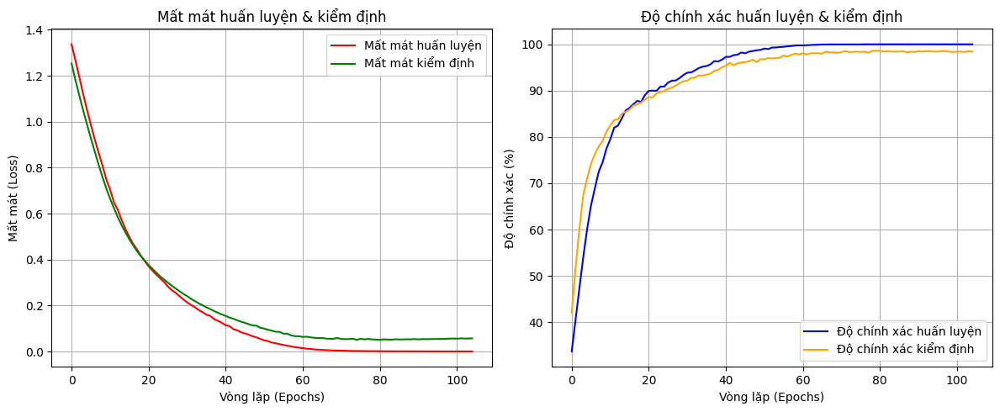

📈 Đã lưu biểu đồ tại /kaggle/working/vgg19/vit_training_plots.png


In [7]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import torch
from transformers import ViTForImageClassification

# Tạo thư mục đầu ra nếu chưa tồn tại
save_dir = '/kaggle/working/vgg19'
os.makedirs(save_dir, exist_ok=True)

# Load model ViT từ file .pth
model_path = '/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth'
try:
    # Khởi tạo model ViT
    model = ViTForImageClassification.from_pretrained(
        'google/vit-base-patch16-224',
        num_labels=4,  # Giả sử 4 lớp (brain tumor dataset), thay đổi nếu khác
        ignore_mismatched_sizes=True
    )
    # Load state_dict từ file .pth
    state_dict = torch.load(model_path, map_location='cpu')  # Dùng 'cuda' nếu có GPU
    if 'model' in state_dict:
        state_dict = state_dict['model']
    elif 'state_dict' in state_dict:
        state_dict = state_dict['state_dict']
    model_dict = model.state_dict()
    state_dict = {k: v for k, v in state_dict.items() if k in model_dict}
    model_dict.update(state_dict)
    model.load_state_dict(model_dict)
    model.eval()  # Chuyển sang chế độ đánh giá
    # print(f"Đã load model ViT từ {model_path}")
except Exception as e:
    print(f"Lỗi khi load model ViT: {e}")
    exit(1)

# Load lịch sử huấn luyện từ file .csv
history_path = '/kaggle/input/vit/pytorch/default/1/vit_training_log.csv'
try:
    # Đọc file CSV
    history = pd.read_csv(history_path)
    
    # In danh sách cột để kiểm tra (tùy chọn, có thể xóa sau khi xác nhận)
    # print(history.columns)
    
    # Gán dữ liệu từ các cột với tên chính xác
    train_losses = history['Train Loss']
    val_losses = history['Val Loss']
    train_accuracies = history['Train Accuracy']
    val_accuracies = history['Val Accuracy']
except Exception as e:
    print(f"Lỗi khi đọc file CSV: {e}")
    exit(1)

# Vẽ biểu đồ lịch sử huấn luyện
plt.figure(figsize=(12, 5))

# Biểu đồ Loss
plt.subplot(1, 2, 1)
plt.plot(train_losses, label='Mất mát huấn luyện', color='red')
plt.plot(val_losses, label='Mất mát kiểm định', color='green')
plt.xlabel('Vòng lặp (Epochs)')
plt.ylabel('Mất mát (Loss)')
plt.title('Mất mát huấn luyện & kiểm định')
plt.legend()
plt.grid()

# Biểu đồ Accuracy
plt.subplot(1, 2, 2)
plt.plot(train_accuracies, label='Độ chính xác huấn luyện', color='blue')
plt.plot(val_accuracies, label='Độ chính xác kiểm định', color='orange')
plt.xlabel('Vòng lặp (Epochs)')
plt.ylabel('Độ chính xác (%)')
plt.title('Độ chính xác huấn luyện & kiểm định')
plt.legend()
plt.grid()

plt.tight_layout()
plot_path = os.path.join(save_dir, 'vit_training_plots.png')
plt.savefig(plot_path)
plt.show()
plt.close()
print(f"📈 Đã lưu biểu đồ tại {plot_path}")

In [4]:
from transformers import ViTForImageClassification
import torch
import torch.nn as nn

# Khởi tạo mô hình
model_name = "google/vit-base-patch16-224"
model = ViTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,  # Thay bằng số lớp thực tế của bạn (dựa trên dataset)
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier giống như lúc huấn luyện
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Chuyển mô hình sang thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Sử dụng thiết bị: {device}")
model.to(device)

# Tải state_dict
model_path = "/kaggle/input/vit_transformer/pytorch/default/1/vit_model_best_acc.pth"
model.load_state_dict(torch.load(model_path, map_location=device))
model.eval()

print("✅ Mô hình đã được tải thành công!")

Sử dụng thiết bị: cuda
✅ Mô hình đã được tải thành công!


In [5]:
import torch.nn as nn

# Hàm tính Accuracy và Loss
def evaluate_accuracy_and_loss(model, data_loader, device, criterion):
    model.eval()
    running_loss = 0.0
    correct_preds = 0
    total_samples = 0

    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Tính Acc & Loss"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits

            loss = criterion(outputs, labels)
            running_loss += loss.item() * images.size(0)

            _, preds = torch.max(outputs, 1)
            correct_preds += (preds == labels).sum().item()
            total_samples += labels.size(0)

    avg_loss = running_loss / total_samples
    accuracy = correct_preds / total_samples

    return accuracy, avg_loss

# Gọi hàm đánh giá
criterion = nn.CrossEntropyLoss()
accuracy_test, loss_test = evaluate_accuracy_and_loss(model, test_loader, device, criterion)

print(f"\n🎯 Accuracy (Test): {accuracy_test * 100:.2f}%")
print(f"📉 Loss (Test): {loss_test:.4f}")


Tính Acc & Loss: 100%|██████████| 82/82 [00:22<00:00,  3.63it/s]


🎯 Accuracy (Test): 98.78%
📉 Loss (Test): 0.0542



Đánh giá trên tập test:


Processing Validation: 100%|██████████| 82/82 [00:26<00:00,  3.07it/s]



F1 Score (Test): 0.9878

Ma trận nhầm lẫn (Test):
[[292   7   0   1]
 [  2 301   2   1]
 [  0   0 405   0]
 [  1   2   0 297]]

Báo cáo phân loại (Test):
              precision    recall  f1-score   support

      glioma       0.99      0.97      0.98       300
  meningioma       0.97      0.98      0.98       306
     notumor       1.00      1.00      1.00       405
   pituitary       0.99      0.99      0.99       300

    accuracy                           0.99      1311
   macro avg       0.99      0.99      0.99      1311
weighted avg       0.99      0.99      0.99      1311

📊 Biểu đồ ma trận nhầm lẫn được lưu tại: /kaggle/working/confusion_matrix_test.png


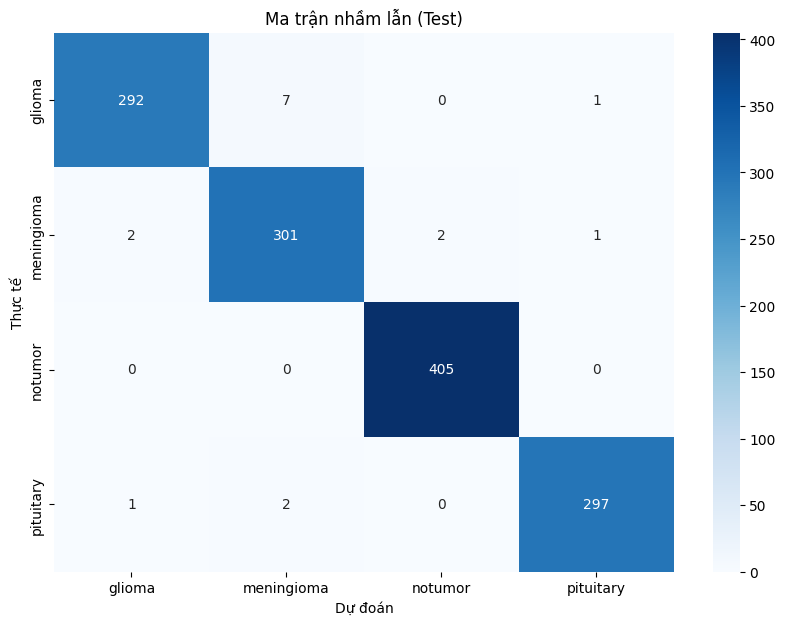


Số ảnh nhận diện sai trên tập Test: 16


In [12]:
import os
import torch
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report, f1_score
import seaborn as sns
import matplotlib.pyplot as plt
from tqdm import tqdm
from PIL import Image

# Hàm lấy dự đoán và thông tin về ảnh nhận diện sai
def get_predictions_with_misclassified(model, data_loader, device, class_names, dataset):
    """
    Đánh giá mô hình, trả về dự đoán, nhãn thực tế và thông tin ảnh nhận diện sai.

    Args:
        model: Mô hình đã huấn luyện
        data_loader: DataLoader chứa dữ liệu cần đánh giá
        device: Thiết bị (CPU/GPU)
        class_names: Danh sách tên lớp
        dataset: Dataset gốc để lấy thông tin ảnh

    Returns:
        y_pred: Dự đoán của mô hình (numpy array)
        y_true: Nhãn thực tế (numpy array)
        misclassified: Danh sách thông tin ảnh nhận diện sai
    """
    model.eval()
    all_preds = []
    all_labels = []
    misclassified = []

    with torch.no_grad():
        for batch_idx, (images, labels) in enumerate(tqdm(data_loader, desc="Processing Validation")):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            _, preds = torch.max(outputs, 1)

            preds_cpu = preds.cpu().numpy()
            labels_cpu = labels.cpu().numpy()

            for i in range(len(labels_cpu)):
                if preds_cpu[i] != labels_cpu[i]:
                    global_idx = batch_idx * data_loader.batch_size + i
                    img_path = dataset.samples[global_idx][0] if hasattr(dataset, 'samples') else 'Unknown'
                    misclassified.append({
                        'image_path': img_path,
                        'true_label': class_names[labels_cpu[i]],
                        'predicted_label': class_names[preds_cpu[i]],
                    })

            all_preds.extend(preds_cpu)
            all_labels.extend(labels_cpu)

    y_pred = np.array(all_preds)
    y_true = np.array(all_labels)
    return y_pred, y_true, misclassified

# Hàm thông báo ảnh nhận diện sai (bỏ lưu và hiển thị ảnh)
def display_misclassified_images(misclassified, save_dir, dataset_name):
    """
    Thông báo số lượng ảnh nhận diện sai, không lưu hoặc hiển thị ảnh.

    Args:
        misclassified: Danh sách thông tin ảnh nhận diện sai
        save_dir: Thư mục lưu ảnh (không sử dụng)
        dataset_name: Tên tập dữ liệu (validation hoặc test)
    """
    print(f"\nSố ảnh nhận diện sai trên tập {dataset_name}: {len(misclassified)}")
    if len(misclassified) == 0:
        print("Không có ảnh nào bị nhận diện sai!")

# Hàm đánh giá và vẽ ma trận nhầm lẫn
def evaluate_and_plot_confusion_matrix(model, data_loader, device, class_names, save_dir, dataset, dataset_name):
    """
    Đánh giá mô hình, tính ma trận nhầm lẫn, thông báo ảnh nhận diện sai.

    Args:
        model: Mô hình đã huấn luyện
        data_loader: DataLoader chứa dữ liệu
        device: Thiết bị (CPU/GPU)
        class_names: Danh sách tên lớp
        save_dir: Thư mục để lưu biểu đồ
        dataset: Dataset gốc để lấy thông tin ảnh
        dataset_name: Tên tập dữ liệu
    """
    y_pred, y_true, misclassified = get_predictions_with_misclassified(model, data_loader, device, class_names, dataset)

    f1 = f1_score(y_true, y_pred, average='weighted')
    print(f'\nF1 Score ({dataset_name}): {f1:.4f}')

    cm = confusion_matrix(y_true, y_pred)
    print(f'\nMa trận nhầm lẫn ({dataset_name}):')
    print(cm)

    print(f"\nBáo cáo phân loại ({dataset_name}):")
    print(classification_report(y_true, y_pred, target_names=class_names))

    plt.figure(figsize=(10, 7))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=class_names,
                yticklabels=class_names)
    plt.xlabel('Dự đoán')
    plt.ylabel('Thực tế')
    plt.title(f'Ma trận nhầm lẫn ({dataset_name})')

    plot_path = os.path.join(save_dir, f'confusion_matrix_{dataset_name.lower()}.png')
    plt.savefig(plot_path)
    print(f"📊 Biểu đồ ma trận nhầm lẫn được lưu tại: {plot_path}")
    plt.show()

    display_misclassified_images(misclassified, save_dir, dataset_name)

    return y_pred, y_true, misclassified

# Thiết lập và chạy cho tập test
save_dir = "/kaggle/working"
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
class_names = test_dataset.classes
model.eval()
model.to(device)

# Đánh giá trên tập test
print("\nĐánh giá trên tập test:")
_, _, misclassified_test = evaluate_and_plot_confusion_matrix(
    model, test_loader, device, class_names, save_dir, test_dataset, "Test"
)

In [13]:
import os
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms
from transformers import ViTForImageClassification, ViTConfig
from tqdm import tqdm
from sklearn.metrics import average_precision_score
import numpy as np

# Thiết lập seed để tái hiện
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
np.random.seed(seed)

# Thiết lập thư mục lưu kết quả
save_dir = "/kaggle/working/vit_results"
os.makedirs(save_dir, exist_ok=True)

# Thiết lập device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Định nghĩa transform cho tập kiểm tra
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Tải dataset kiểm tra
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
class_names = test_dataset.classes
print(f"Class list: {class_names}")
print(f"Number of classes: {len(class_names)}")
print(f"📊 Test images: {len(test_dataset)}")

# Số lớp
num_classes = len(class_names)
output_dim = num_classes
hidden_dim = 768  # Typical hidden dimension for ViT models

print(f"Detected: output_dim={output_dim}, hidden_dim={hidden_dim}")

# Tạo cấu hình tùy chỉnh cho Vision Transformer
config = ViTConfig(
    image_size=224,
    patch_size=16,  # Standard patch size for ViT
    num_channels=3,
    hidden_size=768,  # Embedding dimension
    num_hidden_layers=12,  # Number of transformer layers
    num_attention_heads=12,  # Number of attention heads
    intermediate_size=3072,  # Size of the feed-forward network
    num_labels=output_dim
)

# Khởi tạo mô hình với cấu hình tùy chỉnh
model = ViTForImageClassification(config)

# Tùy chỉnh classifier
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.classifier.in_features, output_dim)
)

# Chuyển mô hình sang device
model.to(device)

# Hàm tính mAP
def calculate_mAP(model, data_loader, device, class_names, save_dir, model_path):
    """
    Tính mAP (mean Average Precision) cho mô hình trên tập dữ liệu.

    Args:
        model: Mô hình đã huấn luyện
        data_loader: DataLoader chứa dữ liệu cần đánh giá
        device: Thiết bị (CPU/GPU)
        class_names: Danh sách tên lớp
        save_dir: Thư mục để lưu kết quả
        model_path: Đường dẫn đến file mô hình đã lưu

    Returns:
        mAP: Giá trị mean Average Precision
        ap_scores: Dictionary chứa AP score cho từng lớp
    """
    # Tải mô hình đã lưu
    try:
        state_dict = torch.load(model_path, map_location=device)
        model.load_state_dict(state_dict, strict=False)
        print(f"✅ Loaded model from {model_path}")
    except Exception as e:
        print(f"❌ Error loading model: {e}")
        return None, None

    model.eval()
    all_probs = []
    all_labels = []

    # Thu thập xác suất dự đoán và nhãn thực tế
    with torch.no_grad():
        for images, labels in tqdm(data_loader, desc="Calculating mAP"):
            images, labels = images.to(device), labels.to(device)
            outputs = model(images).logits
            probs = torch.softmax(outputs, dim=1)  # Chuyển logits thành xác suất
            all_probs.append(probs.cpu().numpy())
            all_labels.append(labels.cpu().numpy())

    # Chuyển sang numpy arrays
    all_probs = np.concatenate(all_probs, axis=0)
    all_labels = np.concatenate(all_labels, axis=0)

    # Chuyển nhãn thành one-hot encoding để tính AP
    num_classes = len(class_names)
    all_labels_one_hot = np.zeros((all_labels.shape[0], num_classes))
    for i, label in enumerate(all_labels):
        all_labels_one_hot[i, label] = 1

    # Tính AP cho từng lớp
    ap_scores = {}
    for class_idx, class_name in enumerate(class_names):
        ap = average_precision_score(all_labels_one_hot[:, class_idx], all_probs[:, class_idx])
        ap_scores[class_name] = ap
        print(f"AP for class '{class_name}': {ap:.4f}")

    # Tính mAP
    mAP = np.mean(list(ap_scores.values()))
    print(f"\nMean Average Precision (mAP): {mAP:.4f}")

    # Lưu kết quả vào file
    result_path = os.path.join(save_dir, "mAP_results.txt")
    with open(result_path, "w") as f:
        f.write(f"Mean Average Precision (mAP): {mAP:.4f}\n")
        f.write("\nAverage Precision per class:\n")
        for class_name, ap in ap_scores.items():
            f.write(f"{class_name}: {ap:.4f}\n")
    print(f"📊 Kết quả mAP được lưu tại: {result_path}")

    return mAP, ap_scores

# Đường dẫn đến mô hình đã lưu
model_path = "/kaggle/input/vit_transformer/pytorch/default/1/vit_model_best_acc.pth"

# Tính mAP trên tập test
print("\nTính mAP trên tập test:")
mAP, ap_scores = calculate_mAP(model, test_loader, device, class_names, save_dir, model_path)

Using device: cuda
Class list: ['glioma', 'meningioma', 'notumor', 'pituitary']
Number of classes: 4
📊 Test images: 1311
Detected: output_dim=4, hidden_dim=768

Tính mAP trên tập test:
✅ Loaded model from /kaggle/input/vit_transformer/pytorch/default/1/vit_model_best_acc.pth


Calculating mAP: 100%|██████████| 82/82 [00:20<00:00,  3.95it/s]

AP for class 'glioma': 0.9949
AP for class 'meningioma': 0.9935
AP for class 'notumor': 1.0000
AP for class 'pituitary': 0.9988

Mean Average Precision (mAP): 0.9968
📊 Kết quả mAP được lưu tại: /kaggle/working/vit_results/mAP_results.txt


Using device: cuda
✅ Mô hình đã được tải thành công!


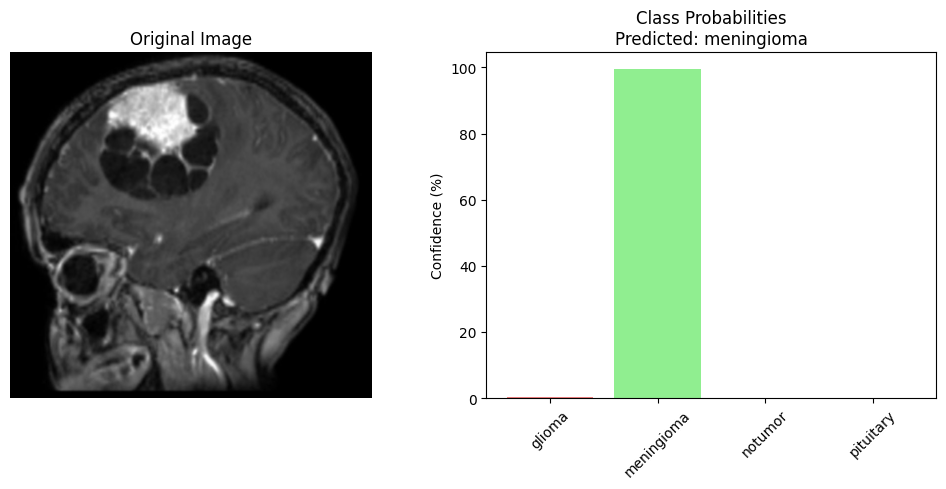


🔍 Prediction Results:
Image: Te-me_0067.jpg
Predicted Class: meningioma
Confidence: 99.63%

📊 Class Probabilities:
glioma: 0.27%
meningioma: 99.63%
notumor: 0.07%
pituitary: 0.03%


In [16]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import ViTForImageClassification
import torch.nn.functional as F
import os
import torch.nn as nn
from torchvision import transforms
import warnings
from transformers.utils import logging

# Tắt toàn bộ cảnh báo
warnings.filterwarnings("ignore")
# Tắt log của thư viện Transformers
logging.set_verbosity_error()
# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/vit/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform chuẩn (đồng bộ với Grad-CAM)
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load model
model_name = "google/vit-base-patch16-224"
model = ViTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier giống Grad-CAM
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Tải state_dict
model_path = "/kaggle/input/vit/pytorch/default/2/vit_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    print("✅ Mô hình đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)

# Chuyển mô hình sang thiết bị và đặt chế độ eval
model.to(device)
model.eval()

# Define class labels (đồng bộ với Grad-CAM)
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

def preprocess_image(image_path):
    """Tiền xử lý ảnh giống Grad-CAM"""
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path, model):
    """
    Dự đoán và trực quan hóa kết quả cho một ảnh duy nhất
    """
    image, input_tensor = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0

    try:
        # Dự đoán
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100

        predicted_label = class_labels[predicted_class]

        # Lưu kết quả
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_result.jpg")

        # Trực quan hóa
        plt.figure(figsize=(10, 5))

        # Ảnh gốc
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')

        # Xác suất các lớp
        plt.subplot(1, 2, 2)
        class_probs = probs[0].cpu().numpy() * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')

        plt.tight_layout()
        plt.savefig(result_path)
        plt.show()

        # In kết quả chi tiết
        print("\n🔍 Prediction Results:")
        print(f"Image: {os.path.basename(image_path)}")
        print(f"Predicted Class: {predicted_label}")
        print(f"Confidence: {confidence:.2f}%")
        print("\n📊 Class Probabilities:")
        for label, prob in zip(class_labels, class_probs):
            print(f"{label}: {prob:.2f}%")

        return predicted_label, confidence

    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0

def predict_batch(folder_path, model, num_samples=None):
    """
    Dự đoán nhiều ảnh từ một thư mục
    """
    if not os.path.exists(folder_path):
        print(f"Error: Folder {folder_path} does not exist")
        return []

    image_files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    if num_samples:
        image_files = image_files[:num_samples]

    results = []
    print(f"\n🚀 Processing {len(image_files)} images...")

    for image_file in image_files:
        image_path = os.path.join(folder_path, image_file)
        predicted_label, confidence = predict_single_image(image_path, model)
        if predicted_label:
            results.append({
                'file': image_file,
                'prediction': predicted_label,
                'confidence': confidence
            })
        print("\n" + "="*50)

    # Lưu tóm tắt vào file
    summary_path = os.path.join(save_dir, "batch_results_summary.txt")
    with open(summary_path, "w") as f:
        f.write("📊 Batch Prediction Summary:\n")
        f.write(f"Total images processed: {len(results)}\n\n")
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        f.write("Predicted Class Distribution:\n")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            f.write(f"{class_name}: {count} images ({percentage:.1f}%)\n")
        if results:
            avg_confidence = sum(result['confidence'] for result in results) / len(results)
            f.write(f"\nAverage confidence: {avg_confidence:.2f}%\n")
        else:
            f.write("\nNo valid results to calculate average confidence\n")

    # In tóm tắt
    print("\n📊 Batch Prediction Summary:")
    print(f"Total images processed: {len(results)}")
    if results:
        class_counts = {}
        for result in results:
            class_counts[result['prediction']] = class_counts.get(result['prediction'], 0) + 1
        print("\nPredicted Class Distribution:")
        for class_name, count in class_counts.items():
            percentage = (count / len(results)) * 100
            print(f"{class_name}: {count} images ({percentage:.1f}%)")
        avg_confidence = sum(result['confidence'] for result in results) / len(results)
        print(f"\nAverage confidence: {avg_confidence:.2f}%")
    else:
        print("No valid results to display")

    print(f"\n✅ Summary saved to: {summary_path}")
    return results

# Sử dụng ví dụ
test_image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0067.jpg"

result = predict_single_image(test_image_path, model)

# Test nhiều ảnh từ thư mục (bỏ comment để sử dụng)
# folder_path = '/content/drive/MyDrive/archive_brain/Testing/meningioma'
# results = predict_batch(folder_path, model, num_samples=5)

2025-05-27 09:18:54.895017: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748337535.411289      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748337535.554081      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Using device: cuda


config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Mô hình đã được tải thành công!


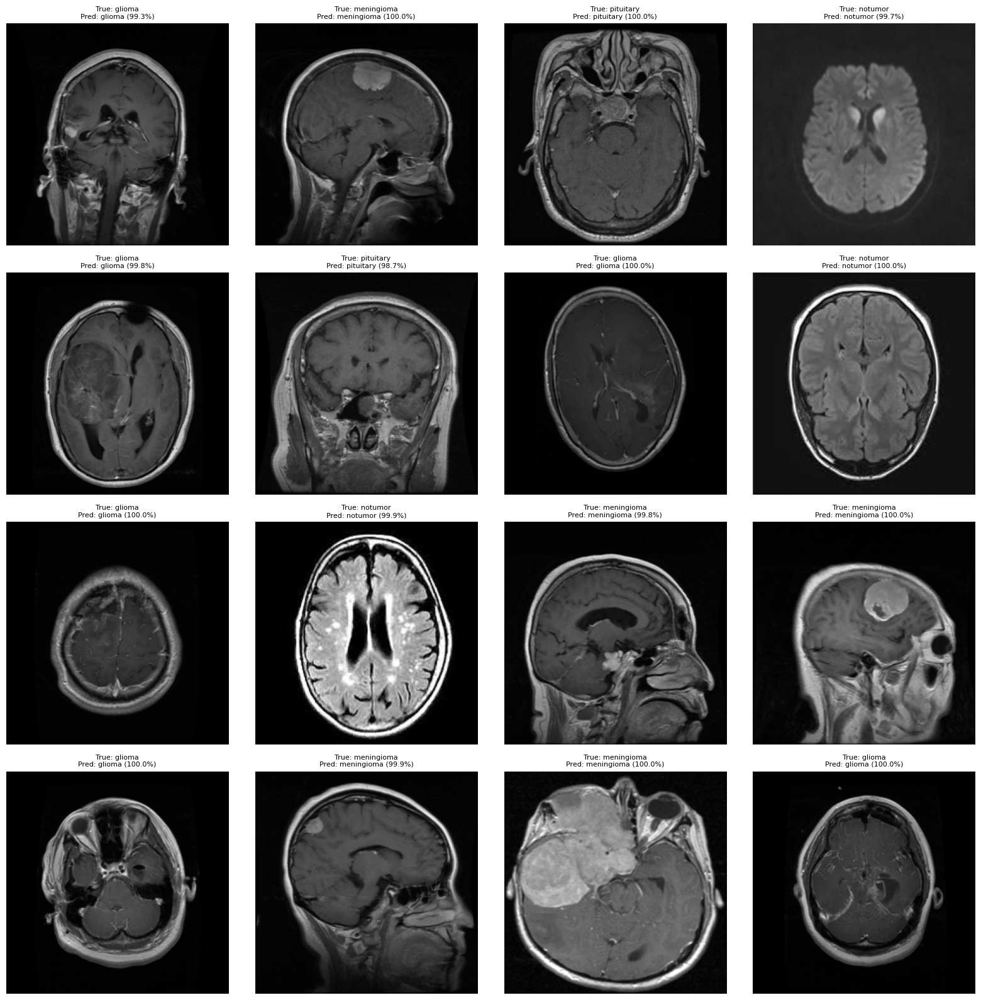

In [1]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from transformers import ViTForImageClassification
import torch.nn.functional as F
import os
import torch.nn as nn
from torchvision import transforms
import random

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Khởi tạo transform chuẩn
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load model
model_name = "google/vit-base-patch16-224"
model = ViTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Tải state_dict
model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device)
    model.load_state_dict(state_dict)
    print("✅ Mô hình đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)

# Chuyển mô hình sang thiết bị và đặt chế độ eval
model.to(device)
model.eval()

# Define class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

def preprocess_image(image_path):
    """Tiền xử lý ảnh"""
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def get_true_label(image_path):
    """Lấy nhãn thực tế từ đường dẫn thư mục"""
    folder_name = os.path.basename(os.path.dirname(image_path)).lower()
    if folder_name in class_labels:
        return folder_name
    return "Unknown"

def predict_random_images(folder_path, model, num_images=16):
    """
    Dự đoán 16 ảnh ngẫu nhiên từ thư mục và hiển thị trong lưới 4x4.
    Hiển thị nhãn thực tế và nhãn dự đoán kèm % trên ảnh.
    Chỉ in tên file và nhãn dự đoán ra console.
    """
    if not os.path.exists(folder_path):
        print(f"Error: Folder {folder_path} does not exist")
        return []

    # Lấy danh sách tất cả ảnh trong thư mục Testing
    image_files = []
    for root, _, files in os.walk(folder_path):
        for f in files:
            if f.lower().endswith(('.png', '.jpg', '.jpeg')):
                image_files.append(os.path.join(root, f))

    if len(image_files) < num_images:
        print(f"Error: Only {len(image_files)} images found, need {num_images}")
        return []

    # Chọn ngẫu nhiên 16 ảnh
    selected_images = random.sample(image_files, num_images)
    results = []

    # Dự đoán và thu thập kết quả
    for image_path in selected_images:
        image, input_tensor = preprocess_image(image_path)
        if image is None or input_tensor is None:
            continue

        try:
            # Lấy nhãn thực tế
            true_label = get_true_label(image_path)

            # Dự đoán
            with torch.no_grad():
                outputs = model(input_tensor)
                logits = outputs.logits
                probs = F.softmax(logits, dim=-1)
                predicted_class = torch.argmax(probs, dim=-1).item()
                predicted_label = class_labels[predicted_class]
                confidence = probs[0][predicted_class].item() * 100

            results.append({
                'file': os.path.basename(image_path),
                'image': image,
                'true_label': true_label,
                'predicted_label': predicted_label,
                'confidence': confidence
            })

            # In kết quả
            # print(f"Image: {os.path.basename(image_path)}, Predicted Class: {predicted_label}")

        except Exception as e:
            print(f"Error processing image {image_path}: {str(e)}")
            continue

    # Hiển thị lưới 4x4
    if results:
        plt.figure(figsize=(16, 16))
        rows, cols = 4, 4
        for i, result in enumerate(results[:num_images]):
            plt.subplot(rows, cols, i + 1)
            image = result['image']
            # Chuẩn hóa kích thước ảnh hiển thị
            image = image.resize((224, 224))
            plt.imshow(image)
            plt.title(f"True: {result['true_label']}\nPred: {result['predicted_label']} ({result['confidence']:.1f}%)", fontsize=8)
            plt.axis('off')
        plt.tight_layout()
        plt.show()

    return results

# Sử dụng ví dụ
testing_folder = "/kaggle/input/brain-tumor-mri-dataset/Testing"
results = predict_random_images(testing_folder, model, num_images=16)

1 ẢNH

Attempting to load model (Attempt 1/3)...
✅ Model loaded successfully in 0.59 seconds!
✅ Mô hình chạy trên thiết bị: cuda


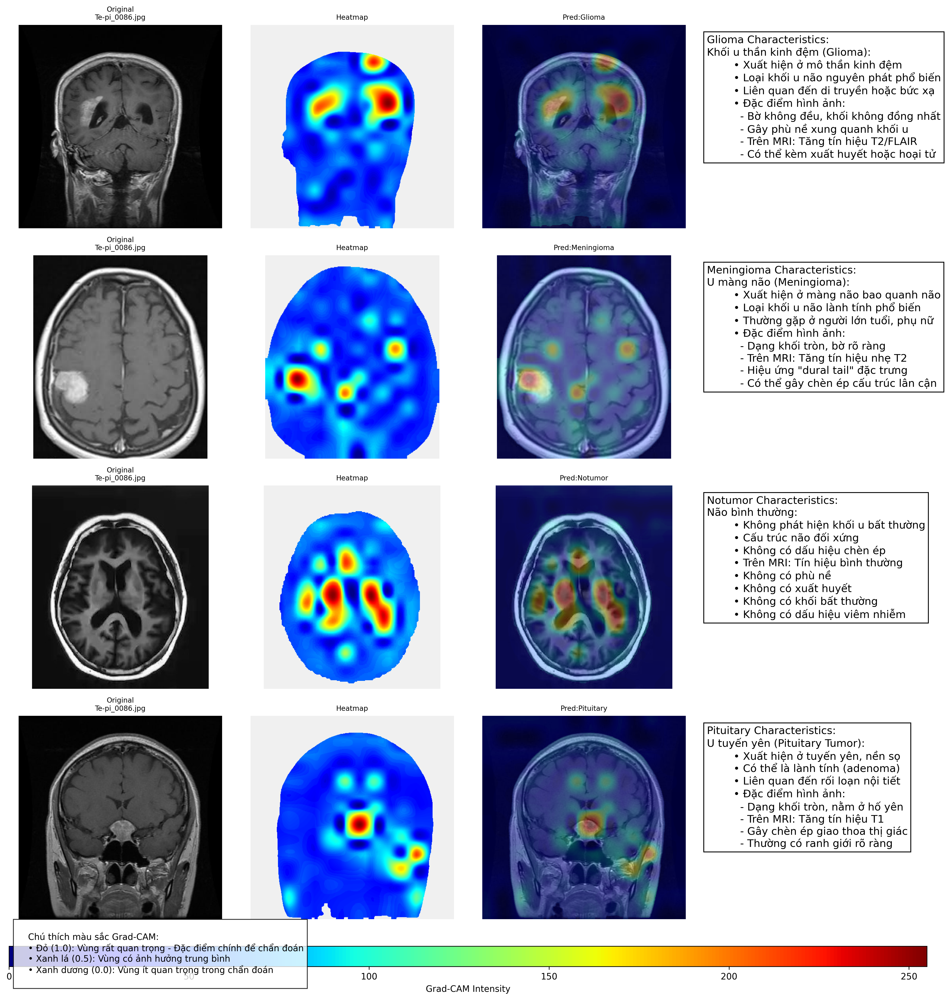


Lưu ý: Kết quả chỉ mang tính tham khảo. Hãy tham khảo ý kiến bác sĩ thần kinh để đánh giá chuyên môn!


In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import ViTImageProcessor, ViTForImageClassification
from torchvision import transforms
from IPython.display import Image as DisplayImage, display
import uuid
from matplotlib.gridspec import GridSpec
import os
import time
import psutil
import warnings
warnings.filterwarnings("ignore")

# Define class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# Image paths (adjusted for local execution)
image_paths = [
    "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0046.jpg",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0023.jpg",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-noTr_0003.jpg",
    "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0086.jpg"
]

def get_brain_tumor_characteristics(tumor_type):
    """
    Trả về thông tin chi tiết về đặc điểm của từng loại khối u não, chuẩn hóa 9 dòng.
    """
    characteristics = {
        'glioma': """
        Khối u thần kinh đệm (Glioma):
        • Xuất hiện ở mô thần kinh đệm
        • Loại khối u não nguyên phát phổ biến
        • Liên quan đến di truyền hoặc bức xạ
        • Đặc điểm hình ảnh:
          - Bờ không đều, khối không đồng nhất
          - Gây phù nề xung quanh khối u
          - Trên MRI: Tăng tín hiệu T2/FLAIR
          - Có thể kèm xuất huyết hoặc hoại tử
        """,
        'meningioma': """
        U màng não (Meningioma):
        • Xuất hiện ở màng não bao quanh não
        • Loại khối u não lành tính phổ biến
        • Thường gặp ở người lớn tuổi, phụ nữ
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, bờ rõ ràng
          - Trên MRI: Tăng tín hiệu nhẹ T2
          - Hiệu ứng "dural tail" đặc trưng
          - Có thể gây chèn ép cấu trúc lân cận
        """,
        'notumor': """
        Não bình thường:
        • Không phát hiện khối u bất thường
        • Cấu trúc não đối xứng
        • Không có dấu hiệu chèn ép
        • Trên MRI: Tín hiệu bình thường
        • Không có phù nề
        • Không có xuất huyết
        • Không có khối bất thường
        • Không có dấu hiệu viêm nhiễm
        """,
        'pituitary': """
        U tuyến yên (Pituitary Tumor):
        • Xuất hiện ở tuyến yên, nền sọ
        • Có thể là lành tính (adenoma)
        • Liên quan đến rối loạn nội tiết
        • Đặc điểm hình ảnh:
          - Dạng khối tròn, nằm ở hố yên
          - Trên MRI: Tăng tín hiệu T1
          - Gây chèn ép giao thoa thị giác
          - Thường có ranh giới rõ ràng
        """
    }
    return characteristics.get(tumor_type, "Không có thông tin")

# Initialize standard transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Initialize feature extractor for ViT
feature_extractor = ViTImageProcessor.from_pretrained('google/vit-base-patch16-224')

class VitGradCAM:
    def __init__(self, model, target_layers=["vit.encoder.layer.6.output"]):
        self.model = model
        self.target_layers = target_layers
        self.hooks = []
        self.gradients = {}
        self.activations = {}
        for layer in target_layers:
            found_layer = False
            for name, module in model.named_modules():
                if layer in name:
                    self.hooks.append(module.register_forward_hook(lambda mod, inp, out, l=layer: self._save_activation(l, out)))
                    self.hooks.append(module.register_full_backward_hook(lambda mod, grad_in, grad_out, l=layer: self._save_gradient(l, grad_out)))
                    found_layer = True
                    break
            if not found_layer:
                print(f"⚠️ Không tìm thấy tầng {layer}.")

    def _save_activation(self, layer, output):
        self.activations[layer] = output.detach()

    def _save_gradient(self, layer, grad_output):
        self.gradients[layer] = grad_output[0].detach()

    def remove_hooks(self):
        for hook in self.hooks:
            hook.remove()
        self.hooks = []

    def generate_cam(self, input_tensor, target_class=None, top_k=1, image=None):
        self.model.eval()
        self.model.zero_grad()
        outputs = self.model(input_tensor, output_attentions=True)
        logits = outputs.logits
        softmax_scores = torch.softmax(logits, dim=1)[0]

        if target_class is None:
            topk_scores, topk_indices = torch.topk(softmax_scores, top_k)
        else:
            topk_indices = [target_class]
            topk_scores = [softmax_scores[target_class]]

        combined_cam = None
        valid_layers = []
        for idx, score in zip(topk_indices, topk_scores):
            self.model.zero_grad()
            one_hot = torch.zeros_like(logits)
            one_hot[0, idx] = 1
            logits.backward(gradient=one_hot, retain_graph=True)

            layer_cam = None
            for layer in self.target_layers:
                cam = self._generate_weighted_attention(input_tensor, idx.item(), image, layer)
                if cam is not None:
                    if layer_cam is None:
                        layer_cam = cam
                    else:
                        layer_cam += cam
                    valid_layers.append(layer)
            
            if layer_cam is not None and valid_layers:
                layer_cam /= len(valid_layers)
                if combined_cam is None:
                    combined_cam = layer_cam * score.item()
                else:
                    combined_cam += layer_cam * score.item()
            else:
                print(f"⚠️ Không có CAM hợp lệ cho lớp {class_labels[idx.item()]}. Sử dụng dự phòng.")
                combined_cam = self._generate_fallback_cam(input_tensor)

        if hasattr(outputs, 'attentions') and outputs.attentions is not None:
            attention_maps = torch.stack(outputs.attentions[-1:]).mean(dim=0)[0, :, 1:, 1:].mean(dim=0).mean(dim=1)
            side_len = int(np.sqrt(len(attention_maps)))
            attention_cam = attention_maps.detach().cpu().numpy().reshape(side_len, side_len)
            attention_cam = (attention_cam - attention_cam.min()) / (attention_cam.max() - attention_cam.min() + 1e-8)
            if combined_cam is not None:
                combined_cam = 0.9 * combined_cam + 0.1 * attention_cam
            else:
                combined_cam = attention_cam

        if combined_cam is None or combined_cam.max() <= combined_cam.min():
            print("⚠️ CAM tổng hợp không hợp lệ. Sử dụng dự phòng.")
            combined_cam = self._generate_fallback_cam(input_tensor)

        if combined_cam.max() > combined_cam.min():
            combined_cam = (combined_cam - combined_cam.min()) / (combined_cam.max() - combined_cam.min() + 1e-8)

        predicted_class = torch.argmax(logits, dim=1).item()
        confidence = softmax_scores[predicted_class].item()
        return combined_cam, confidence, predicted_class

    def _generate_weighted_attention(self, input_tensor, target_class, image=None, layer=None):
        gradients = self.gradients.get(layer)
        activations = self.activations.get(layer)

        if gradients is None or activations is None or gradients.dim() != 3:
            print(f"⚠️ Gradient/activation không hợp lệ cho tầng {layer}. Bỏ qua.")
            return None

        weights = torch.mean(torch.abs(gradients), dim=2)[0][1:]
        weights_mean = torch.mean(weights)
        weights_std = torch.std(weights)
        weights = (weights - weights_mean) / (weights_std + 1e-8)
        weights = torch.relu(weights)

        activations = activations[:, 1:, :]
        cam = torch.einsum('bs,bsh->bs', weights.unsqueeze(0), activations)[0].cpu().numpy()
        side_len = int(np.sqrt(cam.shape[0]))
        cam = cam.reshape(side_len, side_len)
        cam = np.maximum(cam, 0)

        if cam.max() <= cam.min():
            print(f"⚠️ Giá trị CAM không hợp lệ cho tầng {layer}. Bỏ qua.")
            return None

        cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)

        if image is not None:
            image_np = np.array(image.convert("L"))
            image_resized = cv2.resize(image_np, (side_len, side_len), interpolation=cv2.INTER_CUBIC)
            image_normalized = (image_resized - image_resized.min()) / (image_resized.max() - image_resized.min() + 1e-8)
            cam = cam * (0.8 + 0.2 * image_normalized)

        return cam

    def _generate_fallback_cam(self, input_tensor):
        with torch.no_grad():
            outputs = self.model(input_tensor, output_attentions=True)
        if hasattr(outputs, 'attentions') and outputs.attentions is not None:
            attention_maps = torch.stack(outputs.attentions[-1:]).mean(dim=0)[0, :, 1:, 1:].mean(dim=0).mean(dim=1)
            side_len = int(np.sqrt(len(attention_maps)))
            cam = attention_maps.detach().cpu().numpy().reshape(side_len, side_len)
            cam = (cam - cam.min()) / (cam.max() - cam.min() + 1e-8)
            return cam
        print("⚠️ Không có chú ý - Trả về heatmap ngẫu nhiên.")
        return np.random.rand(14, 14)

def create_head_mask(image, original_size):
    image_np = np.array(image.convert("L"))
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    image_enhanced = clahe.apply(image_np)
    thresh_val, binary = cv2.threshold(image_enhanced, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    adjusted_thresh = max(10, thresh_val * 0.7)
    _, binary_adjusted = cv2.threshold(image_enhanced, adjusted_thresh, 255, cv2.THRESH_BINARY)
    kernel = np.ones((5, 5), np.uint8)
    binary_cleaned = cv2.morphologyEx(binary_adjusted, cv2.MORPH_CLOSE, kernel, iterations=2)
    binary_cleaned = cv2.morphologyEx(binary_cleaned, cv2.MORPH_OPEN, kernel, iterations=1)
    contours, _ = cv2.findContours(binary_cleaned, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    mask = np.zeros_like(image_np, dtype=np.uint8)
    if contours:
        areas = [cv2.contourArea(cnt) for cnt in contours]
        if areas:
            min_area = np.mean(areas) * 0.05
            head_contours = [cnt for cnt in contours if cv2.contourArea(cnt) > max(min_area, 50)]
            cv2.drawContours(mask, head_contours, -1, 255, thickness=cv2.FILLED)
        else:
            mask = np.ones_like(image_np, dtype=np.uint8) * 255
    else:
        mask = np.ones_like(image_np, dtype=np.uint8) * 255
    mask = cv2.GaussianBlur(mask, (5, 5), 0)
    mask = np.where(mask > 70, 1.0, 0.0)
    mask = cv2.resize(mask, original_size, interpolation=cv2.INTER_NEAREST)
    return mask

def enhance_contrast(heatmap):
    heatmap_uint8 = np.uint8(255 * heatmap)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    heatmap_enhanced = clahe.apply(heatmap_uint8) / 255.0
    return heatmap_enhanced

def load_custom_model(model_path, num_classes=4, max_retries=3, retry_delay=5):
    model = ViTForImageClassification.from_pretrained('google/vit-base-patch16-224')
    model.classifier = torch.nn.Sequential(
        torch.nn.Dropout(0.3),
        torch.nn.Linear(model.config.hidden_size, num_classes)
    )
    
    mem = psutil.virtual_memory()
    if mem.available < 2 * 1024 * 1024 * 1024:
        warnings.warn("Low memory detected (<2GB). Model loading may fail or be slow.")

    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    map_location = device

    for attempt in range(max_retries):
        try:
            print(f"Attempting to load model (Attempt {attempt + 1}/{max_retries})...")
            start_time = time.time()
            checkpoint = torch.load(model_path, map_location=map_location, weights_only=True)
            model.load_state_dict(checkpoint, strict=False)
            print(f"✅ Model loaded successfully in {time.time() - start_time:.2f} seconds!")
            break
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            if attempt < max_retries - 1:
                print(f"Retrying in {retry_delay} seconds...")
                time.sleep(retry_delay)
            else:
                warnings.warn("Failed with weights_only=True. Falling back to weights_only=False (less secure).")
                try:
                    checkpoint = torch.load(model_path, map_location=map_location, weights_only=False)
                    model.load_state_dict(checkpoint, strict=False)
                    print("✅ Model loaded successfully with weights_only=False!")
                except Exception as e:
                    print(f"❌ Failed to load model: {e}")
                    print("⚠️ Continuing with base model...")
    model.eval()
    return model

def preprocess_image(image_path):
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform(image).unsqueeze(0)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def visualize_detection(image_path, model, target_class=None, background_color=(240, 240, 240)):
    image, input_tensor = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None
    original_size = (image.width, image.height)
    head_mask = create_head_mask(image, original_size)
    head_mask_3c = np.stack([head_mask, head_mask, head_mask], axis=2)
    device = next(model.parameters()).device
    input_tensor = input_tensor.to(device)
    gradcam = VitGradCAM(model)
    cam, confidence, pred_class_idx = gradcam.generate_cam(input_tensor, target_class, image=image)
    gradcam.remove_hooks()
    class_name = class_labels[pred_class_idx]
    cam_resized = cv2.resize(cam, (224, 224), interpolation=cv2.INTER_CUBIC)
    cam_resized = cv2.resize(cam_resized, original_size, interpolation=cv2.INTER_CUBIC)
    cam_resized = cam_resized * (0.7 * head_mask + 0.3)
    if cam_resized.max() > cam_resized.min():
        cam_resized = (cam_resized - cam_resized.min()) / (cam_resized.max() - cam_resized.min() + 1e-8)
        cam_resized = np.clip(cam_resized, 0.01, 1.0)
    else:
        cam_resized = np.zeros_like(cam_resized)
    
    cam_resized = enhance_contrast(cam_resized)
    
    heatmap_uint8 = np.uint8(255 * cam_resized)
    heatmap_colored = cv2.applyColorMap(heatmap_uint8, cv2.COLORMAP_JET)
    heatmap_colored_rgb = cv2.cvtColor(heatmap_colored, cv2.COLOR_BGR2RGB)

    bg_color_bgr = (background_color[2 background_color[1], background_color[0])
    background = np.ones((original_size[1], original_size[0], 3), dtype=np.uint8) * bg_color_bgr
    final_heatmap = np.where(head_mask_3c > 0.1, heatmap_colored_rgb, background)
    
    image_np = np.array(image)
    image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2BGR)
    alpha = 0.3
    overlay = cv2.addWeighted(image_np, 1-alpha, heatmap_colored, alpha, 0)
    overlay_image_rgb = cv2.cvtColor(overlay, cv2.COLOR_BGR2RGB)

    return {
        "original_image": image,
        "heatmap": final_heatmap,
        "overlay": overlay_image_rgb,
        "class_name": class_name,
        "confidence": confidence
    }

def detect_brain_tumor_4x3(model_path, image_paths):
    model = load_custom_model(model_path)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model = model.to(device)
    print(f"✅ Mô hình chạy trên thiết bị: {device}")

    results = []
    for image_path in image_paths:
        result = visualize_detection(image_path, model)
        if result is None:
            print(f"Skipping {image_path} due to processing error.")
            continue
        results.append(result)

    fig = plt.figure(figsize=(16, 16))
    gs = GridSpec(5, 4, height_ratios=[1, 1, 1, 1, 0.1], figure=fig)

    for i, (result, true_class) in enumerate(zip(results, class_labels)):
        ax0 = plt.subplot(gs[i, 0])
        ax0.imshow(result["original_image"])
        ax0.set_title(f"Original\n{os.path.basename(image_paths[i])}", fontsize=8)
        ax0.axis("off")
        ax0.set_aspect('equal')
        for spine in ax0.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        ax1 = plt.subplot(gs[i, 1])
        im = ax1.imshow(result["heatmap"], cmap='jet')
        ax1.set_title("Heatmap", fontsize=8)
        ax1.axis("off")
        ax1.set_aspect('equal')
        for spine in ax1.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        ax2 = plt.subplot(gs[i, 2])
        ax2.imshow(result["overlay"])
        ax2.set_title(f"Pred:{result['class_name'].capitalize()}", fontsize=8)
        ax2.axis("off")
        ax2.set_aspect('equal')
        for spine in ax2.spines.values():
            spine.set_visible(True)
            spine.set_color('black')
            spine.set_linewidth(1)

        ax3 = plt.subplot(gs[i, 3])
        characteristics = get_brain_tumor_characteristics(result['class_name'])
        characteristics_text = f"{result['class_name'].capitalize()} Characteristics:\n{characteristics.strip()}"
        ax3.text(0.01, 0.95, characteristics_text, fontsize=12, verticalalignment='top',
                 bbox=dict(boxstyle='square', facecolor='white', edgecolor='black', linewidth=1))
        ax3.axis("off")

    cbar_ax = plt.subplot(gs[-1, :])
    plt.colorbar(im, cax=cbar_ax, orientation='horizontal', label='Grad-CAM Intensity', cmap='jet')

    text_str = """
    Chú thích màu sắc Grad-CAM:
    • Đỏ (1.0): Vùng rất quan trọng - Đặc điểm chính để chẩn đoán
    • Xanh lá (0.5): Vùng có ảnh hưởng trung bình
    • Xanh dương (0.0): Vùng ít quan trọng trong chẩn đoán
    """
    plt.figtext(0.02, 0.02, text_str, fontsize=10, bbox=dict(facecolor='white', alpha=0.8))

    output_filename = f'detection_output_4x3_{uuid.uuid4().hex}.png'
    plt.tight_layout()
    plt.savefig(output_filename, dpi=300, bbox_inches='tight')
    plt.close(fig)
    try:
        display(DisplayImage(filename=output_filename, width=900, height=1200))
    except Exception as e:
        print(f"Error displaying image: {e}")

    summary_path = "multi_result_summary.txt"
    with open(summary_path, "w") as f:
        f.write("📊 Multi-Image Prediction Summary:\n")
        for image_path, result, true_class in zip(image_paths, results, class_labels):
            f.write(f"\nImage: {os.path.basename(image_path)}\n")
            f.write(f"Predicted Class: {result['class_name']}\n")
            f.write(f"Confidence: {result['confidence']*100:.2f}%\n")
            f.write(f"Characteristics:\n{get_brain_tumor_characteristics(result['class_name'])}\n")
            f.write("-"*50 + "\n")

    print("\nLưu ý: Kết quả chỉ mang tính tham khảo. Hãy tham khảo ý kiến bác sĩ thần kinh để đánh giá chuyên môn!")
    return results

if __name__ == "__main__":
    model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"  # Adjust path as needed
    for path in image_paths:
        if not os.path.exists(path):
            print(f"Warning: Image not found at {path}")
    if not os.path.exists(model_path):
        print(f"Error: Model file not found at {model_path}. Exiting.")
        exit(1)
    results = detect_brain_tumor_4x3(model_path, image_paths)

1 ẢNH

Using device: cuda
✅ Mô hình đã được tải thành công!


Tính toán Integrated Gradients (Te-me_0114.jpg): 100%|██████████| 300/300 [00:09<00:00, 33.30it/s]
Tính toán Integrated Gradients (Te-noTr_0009.jpg): 100%|██████████| 300/300 [00:09<00:00, 32.97it/s]
Tính toán Integrated Gradients (Te-pi_0041.jpg): 100%|██████████| 300/300 [00:09<00:00, 32.60it/s]


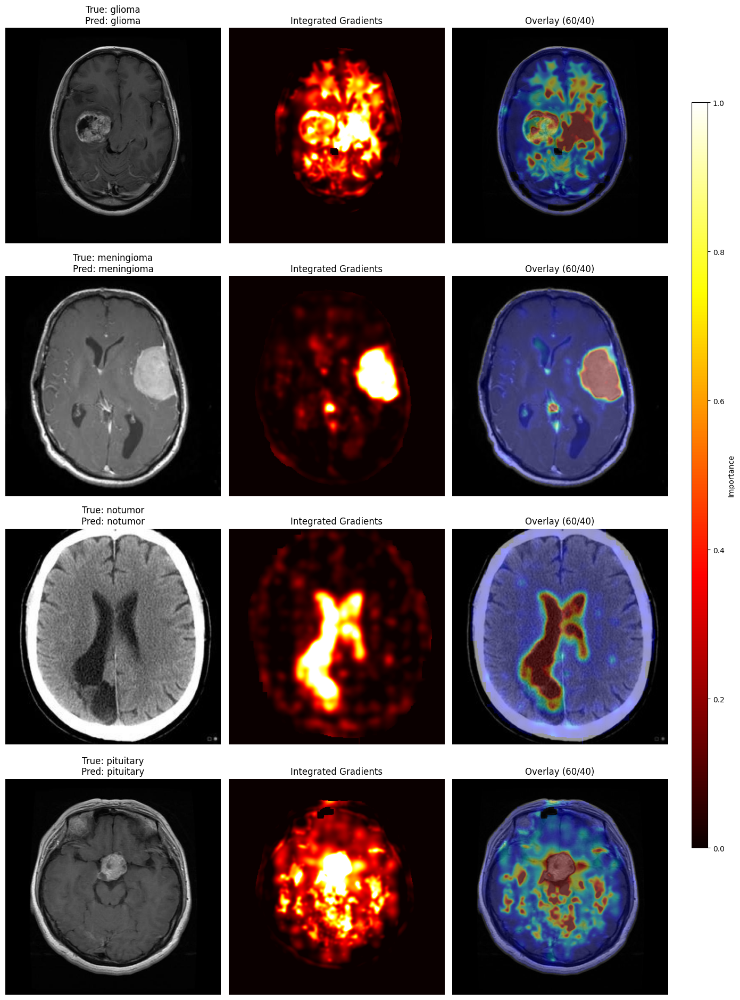

In [5]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import ViTForImageClassification
import torch.nn.functional as F
from scipy.ndimage import gaussian_filter
from tqdm import tqdm
import torch.nn as nn
from torchvision import transforms
import warnings
from transformers.utils import logging

# Tắt toàn bộ cảnh báo
warnings.filterwarnings("ignore")
# Tắt log của thư viện Transformers
logging.set_verbosity_error()
# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/visualization_results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load model
model_name = "google/vit-base-patch16-224"
model = ViTForImageClassification.from_pretrained(
    model_name,
    num_labels=4,
    ignore_mismatched_sizes=True
)
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)
model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device, weights_only=True)
    model.load_state_dict(state_dict)
    print("✅ Mô hình đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)
model.to(device)
model.eval()

# Define class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

def preprocess_image(image_path):
    """Tiền xử lý ảnh"""
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None, None
    try:
        image = Image.open(image_path).convert("RGB")
        original_np = np.array(image)
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor, original_np
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None, None

def predict_single_image(image_path, model):
    """Dự đoán và trả về kết quả phân loại cho một ảnh"""
    image, input_tensor, original_np = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0, None, None
    try:
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100
        predicted_label = class_labels[predicted_class]
        return predicted_label, confidence, input_tensor, original_np
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0, None, None

def segment_brain_region(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    _, thresh = cv2.threshold(gray, 10, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        largest_contour = max(contours, key=cv2.contourArea)
        mask = np.zeros_like(gray)
        cv2.drawContours(mask, [largest_contour], -1, 255, -1)
        x, y, w, h = cv2.boundingRect(largest_contour)
        padding = 20  # Đảm bảo bao quát toàn bộ vùng đầu
        x = max(0, x - padding)
        y = max(0, y - padding)
        w = min(gray.shape[1] - x, w + 2*padding)
        h = min(gray.shape[0] - y, h + 2*padding)
        if len(image.shape) == 3:
            return image[y:y+h, x:x+w], (x, y, w, h)
        return gray[y:y+h, x:x+w], (x, y, w, h)
    return image, (0, 0, image.shape[1], image.shape[0])

def create_brain_mask(image, target_size):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    _, mask = cv2.threshold(gray, 10, 1, cv2.THRESH_BINARY)
    kernel = np.ones((5, 5), np.uint8)
    mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)
    mask = cv2.erode(mask, kernel, iterations=2)
    mask = cv2.resize(mask, target_size, interpolation=cv2.INTER_NEAREST)
    return mask

def create_distance_penalty(shape, power=0.5, pituitary_focus=False):
    h, w = shape
    y, x = np.ogrid[:h, :w]
    if pituitary_focus:
        center_y, center_x = int(h * 0.5), w // 2
    else:
        center_y, center_x = h // 2, w // 2
    distance_from_center = np.sqrt((x - center_x)**2 + (y - center_y)**2)
    max_distance = np.sqrt((center_x)**2 + (center_y)**2)
    distance_penalty = 1 - (distance_from_center / max_distance)**power
    return distance_penalty

def create_pituitary_mask(shape):
    h, w = shape
    mask = np.zeros((h, w), dtype=np.float32)
    y, x = np.ogrid[:h, :w]
    center_y, center_x = h // 2, w // 2
    sigma_y, sigma_x = h / 4, w / 4
    mask = np.exp(-((x - center_x)**2 / (2 * sigma_x**2) + (y - center_y)**2 / (2 * sigma_y**2)))
    mask = gaussian_filter(mask, sigma=5.0)
    mask = (mask - mask.min()) / (mask.max() - mask.min() + 1e-8)
    return mask

def enhance_bright_regions(image, threshold_percentile=85, sigma=3.0):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
    gray = gray.astype(np.float32) / 255.0
    threshold = np.percentile(gray, threshold_percentile)
    bright_mask = (gray > threshold).astype(np.float32)
    bright_mask = gaussian_filter(bright_mask, sigma=sigma)
    bright_mask = (bright_mask - bright_mask.min()) / (bright_mask.max() - bright_mask.min() + 1e-8)
    return bright_mask

def integrated_gradients_visualization(image_path, model, steps=300, sigma=3.0, only_brain=True):
    # Sử dụng predict_single_image để lấy kết quả phân loại
    predicted_label, confidence, img_tensor, original_np = predict_single_image(image_path, model)
    if predicted_label is None or img_tensor is None or original_np is None:
        print(f"Failed to preprocess or predict image {image_path}")
        return None, None, None, None

    # Lấy predicted_class từ predicted_label
    pred_class = class_labels.index(predicted_label)

    if only_brain:
        brain_region, bbox = segment_brain_region(original_np)
        brain_image = Image.fromarray(brain_region)
    else:
        brain_region = original_np
        brain_image = Image.open(image_path).convert("RGB")

    # Sử dụng kích thước gốc của ảnh
    target_size = original_np.shape[:2][::-1]  # (width, height)

    img_tensor = img_tensor.requires_grad_(True)

    # Integrated Gradients
    baseline = torch.zeros_like(img_tensor)
    integrated_grads = torch.zeros_like(img_tensor)
    for alpha in tqdm(np.linspace(0, 1, steps), desc=f"Tính toán Integrated Gradients ({os.path.basename(image_path)})"):
        interpolated_img = baseline + alpha * (img_tensor - baseline)
        interpolated_img.requires_grad_(True)
        outputs = model(interpolated_img)
        grads = torch.autograd.grad(outputs.logits[0, pred_class], interpolated_img)[0]
        integrated_grads += grads / steps

    attribution = (img_tensor - baseline) * integrated_grads
    attribution = attribution.sum(dim=1).detach().cpu().numpy().squeeze()
    attribution = gaussian_filter(np.abs(attribution), sigma=sigma)

    # Resize attribution về kích thước gốc
    attribution = cv2.resize(attribution, target_size, interpolation=cv2.INTER_CUBIC)

    # Tạo brain_mask từ ảnh gốc với kích thước gốc
    brain_mask = create_brain_mask(original_np, target_size)
    attribution = attribution * brain_mask

    pituitary_focus = (predicted_label == "pituitary")
    # Đảo ngược target_size để khớp với kích thước của attribution
    distance_penalty = create_distance_penalty((target_size[1], target_size[0]), power=0.7, pituitary_focus=pituitary_focus)
    attribution = attribution * distance_penalty

    # Áp dụng bright_mask cho các loại khối u
    if predicted_label in ["glioma", "meningioma", "pituitary"]:
        bright_mask = enhance_bright_regions(original_np, threshold_percentile=85, sigma=3.0)
        bright_mask = cv2.resize(bright_mask, target_size, interpolation=cv2.INTER_NEAREST)
        attribution = attribution * (1 + 3.0 * bright_mask)

    if predicted_label == "pituitary":
        pituitary_mask = create_pituitary_mask(target_size)
        attribution = attribution * (1 + 2.0 * pituitary_mask)

    vmin, vmax = np.percentile(attribution[attribution > 0], [15, 95])
    attribution_norm = np.clip((attribution - vmin) / (vmax - vmin + 1e-8), 0, 1)
    attribution_norm = attribution_norm * brain_mask

    heatmap = cv2.applyColorMap(np.uint8(255 * attribution_norm), cv2.COLORMAP_JET)
    heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB) / 255.0

    # Sử dụng ảnh gốc để tạo overlay với kích thước gốc
    brain_np = original_np / 255.0
    overlay = 0.6 * brain_np + 0.4 * heatmap * np.expand_dims(brain_mask, axis=2)
    overlay = np.clip(overlay, 0, 1)

    return original_np, attribution_norm, overlay, predicted_label

def integrated_gradients_visualization_batch(image_paths, model, steps=300, sigma=3.0, save_dir=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    # Tạo bố cục 4x3
    fig, axes = plt.subplots(4, 3, figsize=(15, 20))

    for idx, image_path in enumerate(image_paths):
        if not os.path.exists(image_path):
            print(f"Warning: Image not found at {image_path}")
            for col in range(3):
                axes[idx, col].axis("off")
            continue

        original_np, attribution_norm, overlay, predicted_label = integrated_gradients_visualization(
            image_path, model, steps=steps, sigma=sigma, only_brain=True
        )

        if original_np is None:
            print(f"Skipping visualization for {image_path} due to preprocessing error")
            for col in range(3):
                axes[idx, col].axis("off")
            continue

        label = os.path.basename(image_path).split('-')[1]
        if label.startswith("gl"):
            label = "glioma"
        elif label.startswith("me"):
            label = "meningioma"
        elif label.startswith("no"):
            label = "notumor"
        elif label.startswith("pi"):
            label = "pituitary"
        else:
            label = "unknown"

        # Brain Region
        axes[idx, 0].imshow(original_np)
        axes[idx, 0].set_title(f"True: {label}\nPred: {predicted_label}")
        axes[idx, 0].axis("off")

        # Integrated Gradients
        im = axes[idx, 1].imshow(attribution_norm, cmap="hot")
        axes[idx, 1].set_title("Integrated Gradients")
        axes[idx, 1].axis("off")

        # Overlay
        axes[idx, 2].imshow(overlay)
        axes[idx, 2].set_title("Overlay (60/40)")
        axes[idx, 2].axis("off")

    # Thêm colorbar chung cho tất cả heatmap
    fig.subplots_adjust(right=0.85)
    cbar_ax = fig.add_axes([0.87, 0.15, 0.02, 0.7])
    plt.colorbar(im, cax=cbar_ax, label="Importance")


    plt.tight_layout(rect=[0, 0, 0.85, 0.95])
    if save_dir:
        save_path = os.path.join(save_dir, "integrated_gradients_batch_4x3.png")
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
    plt.show()

if __name__ == "__main__":
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0028.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0114.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-noTr_0009.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0041.jpg"
    ]
    integrated_gradients_visualization_batch(image_paths, model, save_dir=save_dir)

In [1]:
!pip install lime

Using device: cuda


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Model loaded successfully!
Running ViT Transformer with LIME explanation for a single image...

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg
Running LIME explanation for Te-gl_0025.jpg...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!
Grid saved to /kaggle/working/vit_results/lime_explanation_1x4.png


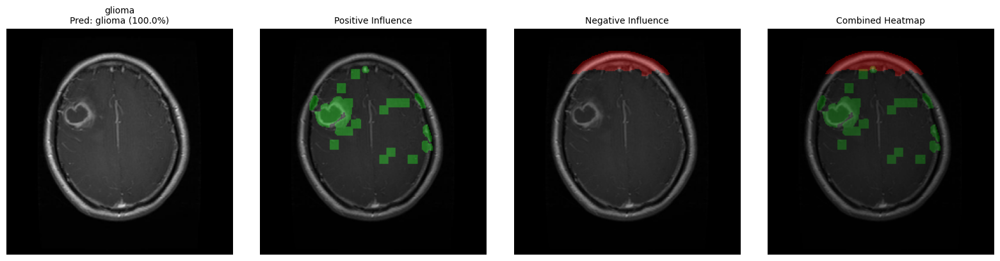

In [16]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image
from transformers import AutoImageProcessor, ViTForImageClassification
import torch.nn as nn
import torch.nn.functional as F
import os
from torchvision import transforms
from lime import lime_image
from skimage.segmentation import slic
import warnings

# Suppress warnings
warnings.filterwarnings("ignore")

# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Define paths
MODEL_PATH = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"
SAVE_DIR = "/kaggle/working/vit_results"
os.makedirs(SAVE_DIR, exist_ok=True)

# Class labels
CLASS_LABELS = ["glioma", "meningioma", "notumor", "pituitary"]

# Initialize ViT model and processor (use fast processor)
MODEL_NAME = "google/vit-base-patch16-224"
processor = AutoImageProcessor.from_pretrained(MODEL_NAME, use_fast=True)

# Define transforms for classification
transform_classification = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Define transforms for LIME
transform_lime = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=processor.image_mean, std=processor.image_std),
])

def initialize_vit_model():
    """Initialize and load ViT model with custom weights."""
    model = ViTForImageClassification.from_pretrained(
        MODEL_NAME,
        num_labels=len(CLASS_LABELS),
        ignore_mismatched_sizes=True
    )
    model.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(model.config.hidden_size, len(CLASS_LABELS))
    )
    
    if os.path.exists(MODEL_PATH):
        try:
            checkpoint = torch.load(MODEL_PATH, map_location=device)
            state_dict = checkpoint.get('model_state_dict', checkpoint)
            model.load_state_dict(state_dict, strict=False)
            print("✅ Model loaded successfully!")
        except Exception as e:
            print(f"❌ Error loading model: {e}")
            return None
    else:
        print(f"❌ Model path {MODEL_PATH} does not exist!")
        return None
    
    model.to(device).eval()
    return model

# Initialize model
model = initialize_vit_model()
if model is None:
    exit(1)

def preprocess_image(image_path):
    """Preprocess an image: load, resize, normalize."""
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform_classification(image).unsqueeze(0).to(device)
        img_np = np.array(image.resize((224, 224)))
        return image, input_tensor, img_np
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None, None

def predict_single_image(image_path, model):
    """Predict and return label and confidence for a single image."""
    image, input_tensor, img_np = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0

    try:
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100
        predicted_label = CLASS_LABELS[predicted_class]
        return predicted_label, confidence
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0

def create_head_mask(img_np):
    """Create a head mask to limit the region of interest."""
    gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    kernel = np.ones((5, 5), np.uint8)
    binary = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel, iterations=1)
    binary = cv2.dilate(binary, kernel, iterations=2)
    contours, _ = cv2.findContours(binary, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    if contours:
        max_contour = max(contours, key=cv2.contourArea)
        binary = np.zeros_like(binary)
        cv2.drawContours(binary, [max_contour], -1, 255, thickness=cv2.FILLED)
    binary = cv2.erode(binary, kernel, iterations=1)
    return binary

def create_center_mask(img_shape, pred_class):
    """Create a mask for specific classes based on anatomical priors."""
    mask = np.zeros(img_shape[:2], dtype=np.uint8)
    height, width = img_shape[:2]
    if pred_class == "glioma":
        mask[int(height*0.3):int(height*0.7), int(width*0.3):int(width*0.7)] = 255
    elif pred_class == "pituitary":
        mask[int(height*0.6):int(height*0.9), int(width*0.4):int(width*0.6)] = 255
    return mask

def batch_predict(images):
    """Batch prediction for LIME using processor normalization."""
    model.eval()
    probs = np.zeros((len(images), len(CLASS_LABELS)))
    for i, img in enumerate(images):
        img_pil = Image.fromarray(np.uint8(img))
        inputs = transform_lime(img_pil).unsqueeze(0).to(device)
        with torch.no_grad():
            outputs = model(inputs)
            probs[i] = F.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

def segment_image(image, head_mask, n_segments=500, compactness=30):
    """Segment the image for LIME."""
    if len(image.shape) == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    enhanced = cv2.GaussianBlur(gray.astype(np.uint8), (3, 3), 0)
    image_masked = image.copy()
    image_masked[head_mask == 0] = 0
    segments = slic(image_masked, n_segments=n_segments, compactness=compactness, sigma=1.0, start_label=1,
                    enforce_connectivity=True, min_size_factor=0.02)
    segments[head_mask == 0] = -1
    return segments

def threshold_regions(importance_map, segments, head_mask, top_percentage=20, pred_class=None):
    """Select important regions within head_mask."""
    segment_ids = np.unique(segments)
    segment_values = {}
    for seg_id in segment_ids:
        if seg_id == -1:
            continue
        segment_mask = (segments == seg_id) & (head_mask > 0)
        if not np.any(segment_mask):
            continue
        segment_values[seg_id] = np.mean(importance_map[segment_mask])
    sorted_segments = sorted(segment_values.items(), key=lambda x: x[1], reverse=True)
    
    if pred_class == "pituitary":
        top_percentage = 10
    elif pred_class == "glioma":
        top_percentage = 5
    elif pred_class == "meningioma":
        top_percentage = 5
    else:  # notumor
        top_percentage = 10

    num_to_keep = max(1, int(len(sorted_segments) * (top_percentage / 100)))
    top_segments = [seg_id for seg_id, _ in sorted_segments[:num_to_keep]]
    return top_segments

def explain_with_lime_for_vit(image_path, num_samples=1500, display_results=False):
    """Explain predictions with LIME using classification results."""
    _, input_tensor, img_np = preprocess_image(image_path)
    if img_np is None:
        return None, None, None, None, None, None

    head_mask = create_head_mask(img_np)
    img_np_masked = img_np.copy()
    img_np_masked[head_mask == 0] = 0

    # Use predict_single_image for classification
    pred_class, pred_prob = predict_single_image(image_path, model)
    if pred_class is None:
        return None, None, None, None, None, None
    pred_class_idx = CLASS_LABELS.index(pred_class)

    # Glioma-specific settings
    if pred_class == "glioma":
        n_segments, compactness = 1000, 10
        num_samples = 1500
        min_area = 10
        blur_kernel = (3, 3)
        hide_color = np.mean(img_np_masked[head_mask > 0], axis=(0, 1)) if np.any(head_mask) else 0
    else:
        n_segments, compactness = 500, 30
        num_samples = 1500
        min_area = 30
        blur_kernel = (5, 5)
        hide_color = 0

    segments = segment_image(img_np_masked, head_mask, n_segments=n_segments, compactness=compactness)

    explainer = lime_image.LimeImageExplainer()
    try:
        print(f"Running LIME explanation for {os.path.basename(image_path)}...")
        explanation = explainer.explain_instance(
            img_np_masked,
            batch_predict,
            segmentation_fn=lambda x: segment_image(x, head_mask, n_segments=n_segments, compactness=compactness),
            top_labels=None,
            labels=[pred_class_idx],
            hide_color=hide_color,
            num_samples=num_samples
        )
        print("LIME explanation completed!")
    except Exception as e:
        print(f"Error in LIME explanation: {e}")
        return None, None, None, None, None, None

    importance_map = np.zeros(segments.shape)
    segment_importance = explanation.local_exp.get(pred_class_idx, [])
    for seg_id, weight in segment_importance:
        segment_mask = (segments == seg_id) & (head_mask > 0)
        if np.any(segment_mask):
            importance_map[segment_mask] = weight

    importance_map = cv2.GaussianBlur(importance_map, blur_kernel, 0)

    # Apply anatomical prior for glioma and pituitary
    if pred_class in ["glioma", "pituitary"]:
        center_mask = create_center_mask(img_np.shape, pred_class)
        weight = 0.3 if pred_class == "glioma" else 0.5
        importance_map = importance_map + (importance_map * (center_mask > 0) * weight)

    importance_map[head_mask == 0] = 0

    positive_mask = np.zeros_like(img_np_masked)
    negative_mask = np.zeros_like(img_np_masked)
    negative_threshold = 0.1
    negative_map = importance_map.copy()
    negative_map[negative_map >= -negative_threshold] = 0
    negative_map = np.abs(negative_map)

    negative_top_percentage = 15
    top_negative_segments = threshold_regions(negative_map, segments, head_mask, top_percentage=negative_top_percentage)

    positive_map = importance_map.copy()
    positive_map[positive_map <= 0] = 0
    positive_map[head_mask == 0] = 0
    top_positive_segments = threshold_regions(positive_map, segments, head_mask, pred_class=pred_class)

    for seg_id in top_positive_segments:
        segment_mask = (segments == seg_id) & (head_mask > 0)
        if np.sum(segment_mask) > min_area:
            positive_mask[segment_mask] = [0, 255, 0]

    for seg_id in top_negative_segments:
        segment_mask = (segments == seg_id) & (head_mask > 0)
        if np.sum(segment_mask) > min_area:
            positive_region = positive_mask[segment_mask].reshape(-1, 3)
            if not np.any(positive_region.sum(axis=1) > 0):
                negative_mask[segment_mask] = [255, 0, 0]

    positive_mask = cv2.dilate(positive_mask, np.ones((3, 3), np.uint8), iterations=1)
    negative_mask = cv2.dilate(negative_mask, np.ones((3, 3), np.uint8), iterations=1)
    positive_mask = cv2.bitwise_and(positive_mask, positive_mask, mask=head_mask)
    negative_mask = cv2.bitwise_and(negative_mask, negative_mask, mask=head_mask)

    combined_heatmap = np.copy(img_np)
    alpha = 0.3 if pred_class == "glioma" else 0.2
    positive_region = positive_mask.sum(axis=2) > 0
    if np.any(positive_region):
        green_highlight = np.zeros_like(img_np)
        green_highlight[positive_region] = [0, 255, 0]
        combined_heatmap = cv2.addWeighted(combined_heatmap, 1 - alpha, green_highlight, alpha, 0)
    negative_region = negative_mask.sum(axis=2) > 0
    if np.any(negative_region):
        red_highlight = np.zeros_like(img_np)
        red_highlight[negative_region] = [255, 0, 0]
        combined_heatmap = cv2.addWeighted(combined_heatmap, 1 - alpha, red_highlight, alpha, 0)

    return img_np, positive_mask, negative_mask, combined_heatmap, pred_class, pred_prob

def test_lime_explanation_single_image(image_path):
    """Test LIME explanation for a single image and display in a 1x4 grid."""
    print(f"\nProcessing image: {image_path}")
    if not os.path.exists(image_path):
        print(f"Error: Image not found at {image_path}")
        return

    # Extract label from filename
    label = os.path.basename(image_path).split('-')[1]
    if label.startswith("gl"):
        label = "glioma"
    elif label.startswith("me"):
        label = "meningioma"
    elif label.startswith("no"):
        label = "notumor"
    elif label.startswith("pi"):
        label = "pituitary"
    else:
        label = "unknown"

    # Create a 1x4 grid
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))

    # Run LIME explanation
    result = explain_with_lime_for_vit(image_path, display_results=False)
    if result is None or result[0] is None:
        print(f"Failed to process image: {image_path}")
        for col in range(4):
            axes[col].axis("off")
            axes[col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
        plt.tight_layout()
        plt.savefig(os.path.join(SAVE_DIR, 'lime_explanation_1x4.png'), dpi=300)
        plt.show()
        return

    img_np, positive_mask, negative_mask, combined_heatmap, pred_class, pred_prob = result

    # Original Image
    axes[0].imshow(img_np)
    axes[0].set_title(f"{label}\nPred: {pred_class} ({pred_prob:.1f}%)", fontsize=10)
    axes[0].axis("off")

    # Positive Influence
    positive_display = np.copy(img_np)
    alpha = 0.3 if pred_class == "glioma" else 0.2
    positive_region = positive_mask.sum(axis=2) > 0
    if np.any(positive_region):
        green_highlight = np.zeros_like(img_np)
        green_highlight[positive_region] = [0, 255, 0]
        positive_display = cv2.addWeighted(positive_display, 1 - alpha, green_highlight, alpha, 0)
    axes[1].imshow(positive_display)
    axes[1].set_title("Positive Influence", fontsize=10)
    axes[1].axis("off")

    # Negative Influence
    negative_display = np.copy(img_np)
    negative_region = negative_mask.sum(axis=2) > 0
    if np.any(negative_region):
        red_highlight = np.zeros_like(img_np)
        red_highlight[negative_region] = [255, 0, 0]
        negative_display = cv2.addWeighted(negative_display, 1 - alpha, red_highlight, alpha, 0)
    axes[2].imshow(negative_display)
    axes[2].set_title("Negative Influence", fontsize=10)
    axes[2].axis("off")

    # Combined Heatmap
    axes[3].imshow(combined_heatmap)
    axes[3].set_title("Combined Heatmap", fontsize=10)
    axes[3].axis("off")

    plt.tight_layout()
    result_path = os.path.join(SAVE_DIR, 'lime_explanation_1x4.png')
    plt.savefig(result_path, dpi=300)
    print(f"Grid saved to {result_path}")
    plt.show()

if __name__ == "__main__":
    print("Running ViT Transformer with LIME explanation for a single image...")
    image_path = "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg"
    test_lime_explanation_single_image(image_path)

Using device: cuda
LIME model loaded successfully with partial weights.
Classification model loaded successfully!
Creating visualization for a single image...

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0067.jpg
Image loaded successfully: (690, 722, 3)
Segmentation done: 93 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Grid saved to /kaggle/working/results/lime_single_image_grid.png


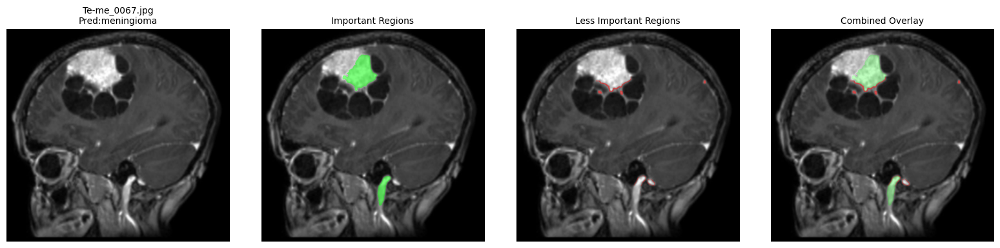

In [18]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from lime import lime_image
from skimage.segmentation import slic
import cv2
from transformers import ViTImageProcessor, ViTForImageClassification
from torchvision import transforms
import os
import torch.nn as nn
import torch.nn.functional as F
import IPython.display as display
import warnings
from transformers.utils import logging

# Tắt toàn bộ cảnh báo
warnings.filterwarnings("ignore")
# Tắt log của thư viện Transformers
logging.set_verbosity_error()
# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/kaggle/working/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform cho classification
transform_classify = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Khởi tạo feature extractor cho LIME
feature_extractor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")

# Class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# 🔍 Initialize ViT model for LIME
def initialize_vit_model_lime():
    model = ViTForImageClassification.from_pretrained(
        "google/vit-base-patch16-224",
        num_labels=4,
        output_hidden_states=True,
        ignore_mismatched_sizes=True
    )
    model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best.pth"
    if not os.path.exists(model_path):
        print(f"Warning: LIME model file not found at {model_path}")
        return model
    try:
        custom_weights = torch.load(model_path, map_location=device, weights_only=True)
        new_state_dict = {}
        model_state_dict = model.state_dict()
        for key in model_state_dict.keys():
            if key in custom_weights and model_state_dict[key].shape == custom_weights[key].shape:
                new_state_dict[key] = custom_weights[key]
        model.load_state_dict(new_state_dict, strict=False)
        print("LIME model loaded successfully with partial weights.")
    except Exception as e:
        print(f"Error loading LIME model: {e}")
    return model

# 🔍 Initialize ViT model for classification
def initialize_vit_model_classify():
    model = ViTForImageClassification.from_pretrained(
        "google/vit-base-patch16-224",
        num_labels=4,
        ignore_mismatched_sizes=True
    )
    model.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(model.config.hidden_size, model.config.num_labels)
    )
    model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"
    try:
        state_dict = torch.load(model_path, map_location=device, weights_only=True)
        model.load_state_dict(state_dict)
        print("Classification model loaded successfully!")
    except Exception as e:
        print(f"Error loading classification model: {e}")
        return None
    return model

# Load models
model_lime = initialize_vit_model_lime()
model_lime.to(device).eval()
model_classify = initialize_vit_model_classify()
if model_classify is None:
    print("Failed to load classification model. Exiting.")
    exit(1)
model_classify.to(device).eval()

# 🔍 Preprocess for classification
def preprocess_image_classify(image_path):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform_classify(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path):
    image, input_tensor = preprocess_image_classify(image_path)
    if image is None or input_tensor is None:
        return None, 0, None
    try:
        with torch.no_grad():
            outputs = model_classify(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100
        predicted_label = class_labels[predicted_class]
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_classify_result.jpg")
        plt.figure(figsize=(10, 5))
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        class_probs = probs[0].cpu().numpy() * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')
        plt.tight_layout()
        plt.savefig(result_path)
        plt.close()
        return predicted_label, confidence, image
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0, None

# 🔍 Batch prediction for LIME
def batch_predict(images):
    model_lime.eval()
    probs = np.zeros((len(images), len(class_labels)))
    for i, img in enumerate(images):
        img_pil = Image.fromarray(np.uint8(img))
        inputs = feature_extractor(images=img_pil, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model_lime(**inputs)
            probs[i] = F.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

# 🔍 Image segmentation for LIME
def segment_image(image, n_segments=80, compactness=30):
    if len(image.shape) == 3 and image.shape[2] == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image.copy()
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray.astype(np.uint8))
    enhanced = cv2.GaussianBlur(enhanced, (3, 3), 0)
    segments = slic(image, n_segments=n_segments, compactness=compactness, sigma=1.0, start_label=1,
                    enforce_connectivity=True, min_size_factor=0.02)
    return segments

# 🔍 Threshold regions for LIME
def threshold_regions(importance_map, segments, top_percentage=10):
    segment_ids = np.unique(segments)
    segment_values = {}
    for seg_id in segment_ids:
        segment_values[seg_id] = np.mean(importance_map[segments == seg_id])
    sorted_segments = sorted(segment_values.items(), key=lambda x: x[1], reverse=True)
    num_to_keep = max(1, int(len(sorted_segments) * (top_percentage / 100)))
    top_segments = [seg_id for seg_id, _ in sorted_segments[:num_to_keep]]
    return top_segments

# 🔍 LIME explanation function
def explain_with_lime_for_vit(image_path, pred_class, num_samples=500):
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return None, None, None
    try:
        img = Image.open(image_path).convert("RGB")
        img_np = np.array(img)
        print(f"Image loaded successfully: {img_np.shape}")
        segments = segment_image(img_np, n_segments=80, compactness=30)
        print(f"Segmentation done: {len(np.unique(segments))} segments")
        explainer = lime_image.LimeImageExplainer()
        print("Running LIME explanation...")
        top_label = class_labels.index(pred_class)
        explanation = explainer.explain_instance(
            img_np,
            batch_predict,
            segmentation_fn=lambda x: segments,
            top_labels=None,
            labels=(top_label,),
            hide_color=0,
            num_samples=num_samples
        )
        print("LIME explanation completed!")
        segment_importance = explanation.local_exp[top_label]
        importance_map = np.zeros(segments.shape)
        for segment_id, weight in segment_importance:
            importance_map[segments == segment_id] = weight
        important_regions = np.copy(img_np)  # Use original image as base
        less_important_regions = np.copy(img_np)  # Use original image as base
        positive_map = importance_map.copy()
        positive_map[positive_map <= 0] = 0
        top_positive_segments = threshold_regions(positive_map, segments, top_percentage=5)
        for seg_id in top_positive_segments:
            important_regions[segments == seg_id] = [0, 255, 0]  # Green
        negative_map = importance_map.copy()
        negative_map[negative_map >= 0] = 0
        negative_map = np.abs(negative_map)
        top_negative_segments = threshold_regions(negative_map, segments, top_percentage=5)
        for seg_id in top_negative_segments:
            less_important_regions[segments == seg_id] = [255, 0, 0]  # Red
        if pred_class == "meningioma":
            gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
            _, bright_mask = cv2.threshold(gray, 150, 255, cv2.THRESH_BINARY)
            kernel = np.ones((5,5), np.uint8)
            bright_mask = cv2.dilate(bright_mask, kernel, iterations=1)
        elif pred_class == "glioma":
            gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            enhanced = clahe.apply(gray.astype(np.uint8))
            _, bright_mask = cv2.threshold(enhanced, 110, 255, cv2.THRESH_BINARY)
            sobelx = cv2.Sobel(enhanced, cv2.CV_64F, 1, 0, ksize=3)
            sobely = cv2.Sobel(enhanced, cv2.CV_64F, 0, 1, ksize=3)
            sobel = np.hypot(sobelx, sobely)
            sobel_mask = (sobel > np.percentile(sobel, 90)).astype(np.uint8) * 255
            bright_mask = cv2.bitwise_or(bright_mask, sobel_mask)
            kernel = np.ones((3,3), np.uint8)
            bright_mask = cv2.dilate(bright_mask, kernel, iterations=1)
        elif pred_class == "notumor":
            gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
            gray = cv2.GaussianBlur(gray, (5,5), 0)
            _, bright_mask = cv2.threshold(gray, 110, 255, cv2.THRESH_BINARY)
            kernel = np.ones((3,3), np.uint8)
            bright_mask = cv2.dilate(bright_mask, kernel, iterations=1)
        elif pred_class == "pituitary":
            gray = cv2.cvtColor(img_np, cv2.COLOR_RGB2GRAY)
            clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
            enhanced = clahe.apply(gray.astype(np.uint8))
            _, bright_mask = cv2.threshold(enhanced, 170, 255, cv2.THRESH_BINARY)
            kernel = np.ones((5,5), np.uint8)
            bright_mask = cv2.morphologyEx(bright_mask, cv2.MORPH_CLOSE, kernel)
            bright_mask = cv2.dilate(bright_mask, kernel, iterations=2)
        important_regions = cv2.bitwise_and(important_regions, important_regions, mask=bright_mask)
        less_important_regions = cv2.bitwise_and(less_important_regions, less_important_regions, mask=bright_mask)
        return img_np, important_regions, less_important_regions
    except Exception as e:
        print(f"Error during LIME explanation for {image_path}: {e}")
        return None, None, None

# 📌 Create visualization for a single image (1 row, 4 columns)
def create_4x4_grid(image_paths):
    if len(image_paths) != 1:
        print("Please provide exactly one image path.")
        return

    image_path = image_paths[0]
    print(f"\nProcessing image: {image_path}")

    # Create figure with 1 row and 4 columns
    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    plt.tight_layout(pad=1.0, w_pad=0.5, h_pad=0.5)

    # Run classification
    pred_label, pred_confidence, image = predict_single_image(image_path)
    if pred_label is None:
        print(f"Skipping {image_path} due to classification error.")
        for col in range(4):
            axes[col].axis("off")
            axes[col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
        return

    # Run LIME explanation using classification model's prediction
    img_np, important_regions, less_important_regions = explain_with_lime_for_vit(
        image_path, pred_class=pred_label, num_samples=1500
    )
    if img_np is None:
        print(f"Skipping {image_path} due to LIME error.")
        for col in range(4):
            axes[col].axis("off")
            axes[col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
        return

    # Column 1: Original image with classification prediction
    axes[0].imshow(img_np)
    axes[0].set_title(f"{os.path.basename(image_path)}\nPred:{pred_label}", fontsize=10)
    axes[0].axis("off")

    # Column 2: Important regions (original image with green overlay)
    important_display = np.copy(img_np)  # Use original image as base
    important_mask = (important_regions.sum(axis=2) > 0).astype(np.uint8) * 255
    alpha = 0.5
    for c in range(3):
        important_display[:, :, c] = np.where(
            important_mask > 0,
            (alpha * important_regions[:, :, c] + (1 - alpha) * img_np[:, :, c]).astype(np.uint8),
            img_np[:, :, c]
        )
    axes[1].imshow(important_display)
    axes[1].set_title("Important Regions", fontsize=10)
    axes[1].axis("off")

    # Column 3: Less important regions (original image with red overlay)
    less_important_display = np.copy(img_np)  # Use original image as base
    less_important_mask = (less_important_regions.sum(axis=2) > 0).astype(np.uint8) * 255
    for c in range(3):
        less_important_display[:, :, c] = np.where(
            less_important_mask > 0,
            (alpha * less_important_regions[:, :, c] + (1 - alpha) * img_np[:, :, c]).astype(np.uint8),
            img_np[:, :, c]
        )
    axes[2].imshow(less_important_display)
    axes[2].set_title("Less Important Regions", fontsize=10)
    axes[2].axis("off")

    # Column 4: Combined overlay
    combined_image = np.copy(img_np)
    for c in range(3):
        combined_image[:, :, c] = np.where(
            important_mask > 0,
            (alpha * important_regions[:, :, c] + (1 - alpha) * combined_image[:, :, c]).astype(np.uint8),
            combined_image[:, :, c]
        )
        combined_image[:, :, c] = np.where(
            less_important_mask > 0,
            (alpha * less_important_regions[:, :, c] + (1 - alpha) * combined_image[:, :, c]).astype(np.uint8),
            combined_image[:, :, c]
        )
    axes[3].imshow(combined_image)
    axes[3].set_title("Combined Overlay", fontsize=10)
    axes[3].axis("off")

    result_path = os.path.join(save_dir, "lime_single_image_grid.png")
    plt.savefig(result_path, bbox_inches="tight")
    plt.close()
    print(f"\nGrid saved to {result_path}")
    display.display(display.Image(result_path))

# 📌 Main execution
if __name__ == "__main__":
    print("Creating visualization for a single image...")
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0067.jpg"
    ]
    for path in image_paths:
        if not os.path.exists(path):
            print(f"Warning: Image not found at {path}")
            exit(1)
    create_4x4_grid(image_paths)

Using device: cuda
LIME model loaded successfully with partial weights.
Classification model loaded successfully!
Creating 4x4 LIME and Classification grid...

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 100 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0030.jpg
Image loaded successfully: (303, 252, 3)
Segmentation done: 106 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0016.jpg
Image loaded successfully: (218, 236, 3)
Segmentation done: 95 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Processing image: /kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0008.jpg
Image loaded successfully: (512, 512, 3)
Segmentation done: 108 segments
Running LIME explanation...


  0%|          | 0/1500 [00:00<?, ?it/s]

LIME explanation completed!

Grid saved to /kaggle/working/results/lime_4x4_grid.png


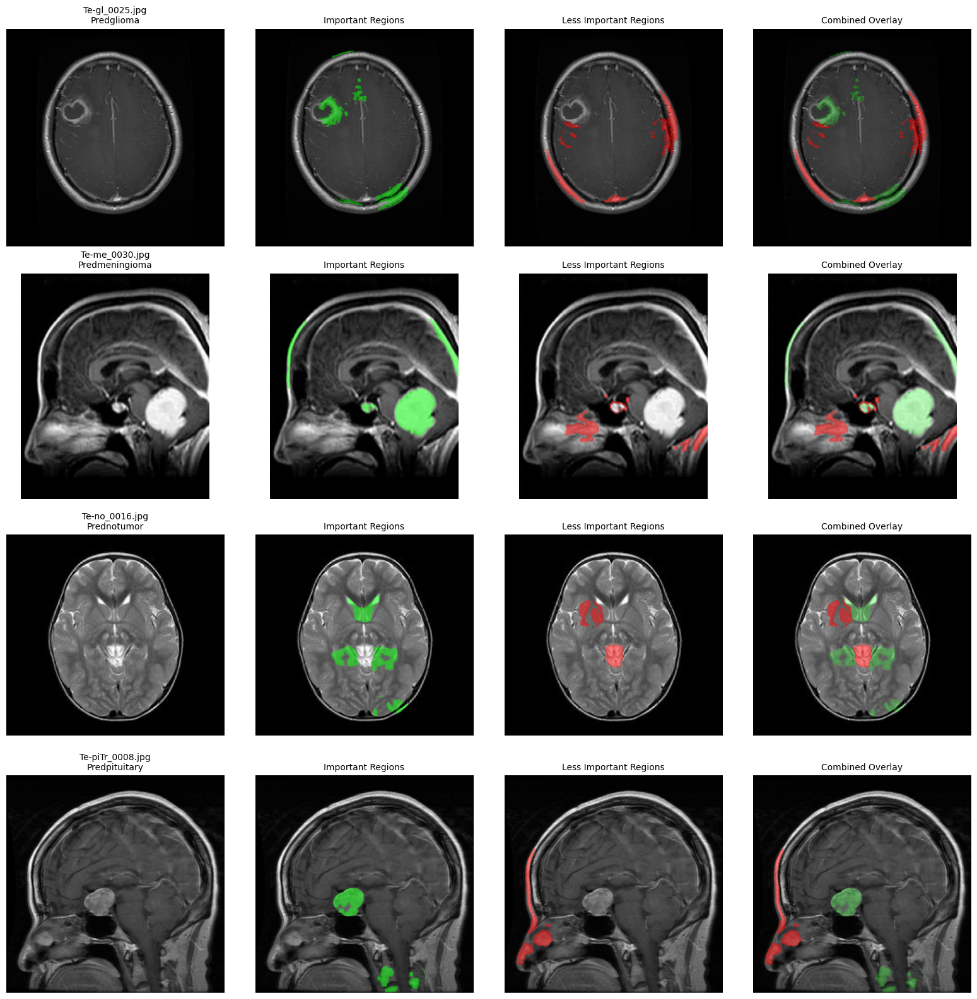

In [3]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from lime import lime_image
from skimage.segmentation import slic
import cv2
from transformers import ViTImageProcessor, ViTForImageClassification
from torchvision import transforms
import os
import torch.nn as nn
import torch.nn.functional as F
import IPython.display as display
import warnings
from transformers.utils import logging

# Tắt toàn bộ cảnh báo
warnings.filterwarnings("ignore")
# Tắt log của thư viện Transformers
logging.set_verbosity_error()
# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/kaggle/working/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform cho classification
transform_classify = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Khởi tạo feature extractor cho LIME
feature_extractor = ViTImageProcessor.from_pretrained("google/vit-base-patch16-224")

# Class labels
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]

# 🔍 Initialize ViT model for LIME
def initialize_vit_model_lime():
    model = ViTForImageClassification.from_pretrained(
        "google/vit-base-patch16-224",
        num_labels=4,
        output_hidden_states=True,
        ignore_mismatched_sizes=True
    )
    model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best.pth"
    if not os.path.exists(model_path):
        print(f"Warning: LIME model file not found at {model_path}")
        return model
    try:
        custom_weights = torch.load(model_path, map_location=device, weights_only=True)
        new_state_dict = {}
        model_state_dict = model.state_dict()
        for key in model_state_dict.keys():
            if key in custom_weights and model_state_dict[key].shape == custom_weights[key].shape:
                new_state_dict[key] = custom_weights[key]
        model.load_state_dict(new_state_dict, strict=False)
        print("LIME model loaded successfully with partial weights.")
    except Exception as e:
        print(f"Error loading LIME model: {e}")
    return model

# 🔍 Initialize ViT model for classification
def initialize_vit_model_classify():
    model = ViTForImageClassification.from_pretrained(
        "google/vit-base-patch16-224",
        num_labels=4,
        ignore_mismatched_sizes=True
    )
    model.classifier = nn.Sequential(
        nn.Dropout(0.3),
        nn.Linear(model.config.hidden_size, model.config.num_labels)
    )
    model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"
    try:
        state_dict = torch.load(model_path, map_location=device, weights_only=True)
        model.load_state_dict(state_dict)
        print("Classification model loaded successfully!")
    except Exception as e:
        print(f"Error loading classification model: {e}")
        return None
    return model

# Load models
model_lime = initialize_vit_model_lime()
model_lime.to(device).eval()
model_classify = initialize_vit_model_classify()
if model_classify is None:
    print("Failed to load classification model. Exiting.")
    exit(1)
model_classify.to(device).eval()

# 🔍 Preprocess for classification
def preprocess_image_classify(image_path):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None
    try:
        image = Image.open(image_path).convert("RGB")
        input_tensor = transform_classify(image).unsqueeze(0).to(device)
        return image, input_tensor
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None

def predict_single_image(image_path):
    image, input_tensor = preprocess_image_classify(image_path)
    if image is None or input_tensor is None:
        return None, 0, None
    try:
        with torch.no_grad():
            outputs = model_classify(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100
        predicted_label = class_labels[predicted_class]
        result_path = os.path.join(save_dir, f"{os.path.basename(image_path).split('.')[0]}_classify_result.jpg")
        plt.figure(figsize=(10, 5))
        image_cv2 = cv2.cvtColor(np.array(image), cv2.COLOR_RGB2BGR)
        plt.subplot(1, 2, 1)
        plt.imshow(image_cv2)
        plt.title('Original Image')
        plt.axis('off')
        plt.subplot(1, 2, 2)
        class_probs = probs[0].cpu().numpy() * 100
        colors = ['lightcoral' if i != predicted_class else 'lightgreen' for i in range(len(class_labels))]
        plt.bar(class_labels, class_probs, color=colors)
        plt.title(f'Class Probabilities\nPredicted: {predicted_label}')
        plt.xticks(rotation=45)
        plt.ylabel('Confidence (%)')
        plt.tight_layout()
        plt.savefig(result_path)
        plt.close()
        return predicted_label, confidence, image
    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0, None

# 🔍 Batch prediction for LIME
def batch_predict(images):
    model_lime.eval()
    probs = np.zeros((len(images), len(class_labels)))
    for i, img in enumerate(images):
        img_pil = Image.fromarray(np.uint8(img))
        inputs = feature_extractor(images=img_pil, return_tensors="pt").to(device)
        with torch.no_grad():
            outputs = model_lime(**inputs)
            probs[i] = F.softmax(outputs.logits, dim=1).cpu().numpy()
    return probs

# 🔍 Image segmentation for LIME
def segment_image(image, n_segments=80, compactness=30):
    segments = slic(image, n_segments=n_segments, compactness=compactness, sigma=1.0, start_label=1,
                    enforce_connectivity=True, min_size_factor=0.02)
    return segments

# 🔍 LIME explanation function without thresholding
def explain_with_lime_for_vit(image_path, pred_class, num_samples=500):
    if not os.path.exists(image_path):
        print(f"Error: Image file not found at {image_path}")
        return None, None, None
    try:
        img = Image.open(image_path).convert("RGB")
        img_np = np.array(img)
        print(f"Image loaded successfully: {img_np.shape}")
        segments = segment_image(img_np, n_segments=80, compactness=30)
        print(f"Segmentation done: {len(np.unique(segments))} segments")
        explainer = lime_image.LimeImageExplainer()
        print("Running LIME explanation...")
        top_label = class_labels.index(pred_class)
        explanation = explainer.explain_instance(
            img_np,
            batch_predict,
            segmentation_fn=lambda x: segments,
            top_labels=None,
            labels=(top_label,),
            hide_color=0,
            num_samples=num_samples
        )
        print("LIME explanation completed!")
        segment_importance = explanation.local_exp[top_label]
        importance_map = np.zeros(segments.shape)
        for segment_id, weight in segment_importance:
            importance_map[segments == segment_id] = weight
        # Positive regions (contributing to prediction)
        positive_regions = np.copy(img_np)
        positive_mask = (importance_map > 0).astype(np.uint8) * 255
        for c in range(3):
            positive_regions[:, :, c] = np.where(
                positive_mask > 0,
                (0.5 * np.array([0, 255, 0])[c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
        # Negative regions (detracting from prediction)
        negative_regions = np.copy(img_np)
        negative_mask = (importance_map < 0).astype(np.uint8) * 255
        for c in range(3):
            negative_regions[:, :, c] = np.where(
                negative_mask > 0,
                (0.5 * np.array([255, 0, 0])[c] + 0.5 * img_np[:, :, c]).astype(np.uint8),
                img_np[:, :, c]
            )
        return img_np, positive_regions, negative_regions
    except Exception as e:
        print(f"Error during LIME explanation for {image_path}: {e}")
        return None, None, None

# 📌 Create 4x4 grid with classification and LIME
def create_4x4_grid(image_paths):
    fig, axes = plt.subplots(4, 4, figsize=(16, 16))
    plt.tight_layout(pad=1.0, w_pad=0.5, h_pad=0.5)
    for row, image_path in enumerate(image_paths):
        print(f"\nProcessing image: {image_path}")
        # Run classification
        pred_label, pred_confidence, image = predict_single_image(image_path)
        if pred_label is None:
            print(f"Skipping {image_path} due to classification error.")
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue
        # Run LIME explanation using classification model's prediction
        img_np, positive_regions, negative_regions = explain_with_lime_for_vit(
            image_path, pred_class=pred_label, num_samples=1500
        )
        if img_np is None:
            print(f"Skipping {image_path} due to LIME error.")
            for col in range(4):
                axes[row, col].axis("off")
                axes[row, col].text(0.5, 0.5, "Error", ha="center", va="center", fontsize=12)
            continue
        # Column 1: Original image with classification prediction
        axes[row, 0].imshow(img_np)
        axes[row, 0].set_title(f"{os.path.basename(image_path)}\nPred:{pred_label}", fontsize=10)
        axes[row, 0].axis("off")
        # Column 2: Positive regions (LIME)
        axes[row, 1].imshow(positive_regions)
        axes[row, 1].set_title("Positive Regions (LIME)", fontsize=10)
        axes[row, 1].axis("off")
        # Column 3: Negative regions (LIME)
        axes[row, 2].imshow(negative_regions)
        axes[row, 2].set_title("Negative Regions (LIME)", fontsize=10)
        axes[row, 2].axis("off")
        # Column 4: Combined overlay
        combined_image = np.copy(img_np)
        positive_mask = (positive_regions.sum(axis=2) > 0).astype(np.uint8) * 255
        negative_mask = (negative_regions.sum(axis=2) > 0).astype(np.uint8) * 255
        alpha = 0.5
        for c in range(3):
            combined_image[:, :, c] = np.where(
                positive_mask > 0,
                (alpha * positive_regions[:, :, c] + (1 - alpha) * img_np[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
            combined_image[:, :, c] = np.where(
                negative_mask > 0,
                (alpha * negative_regions[:, :, c] + (1 - alpha) * combined_image[:, :, c]).astype(np.uint8),
                combined_image[:, :, c]
            )
        axes[row, 3].imshow(combined_image)
        axes[row, 3].set_title("Combined Overlay", fontsize=10)
        axes[row, 3].axis("off")
    result_path = os.path.join(save_dir, "lime_4x4_grid.png")
    plt.savefig(result_path, bbox_inches="tight")
    plt.close()
    print(f"\nGrid saved to {result_path}")
    try:
        display.display(display.Image(result_path))
    except Exception as e:
        print(f"Error displaying image: {e}")

# 📌 Main execution
if __name__ == "__main__":
    print("Creating 4x4 LIME and Classification grid...")
    image_paths = [
        "/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0025.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0030.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0016.jpg",
        "/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-piTr_0008.jpg"
    ]
    for path in image_paths:
        if not os.path.exists(path):
            print(f"Warning: Image not found at {path}")
    create_4x4_grid(image_paths)

Using device: cuda


Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Mô hình đã được tải thành công!


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [02:41, 161.09s/it]              


Shape giá trị SHAP: (1, 154, 154, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 154, 154, 4)
Tổng giá trị SHAP tích cực: 0.05371603890178876
Tổng giá trị SHAP tiêu cực: 0.1451979961408197


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:04, 184.17s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.8932063944528719
Tổng giá trị SHAP tiêu cực: 0.414071176706141


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:24, 204.53s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.5622525907816143
Tổng giá trị SHAP tiêu cực: 0.3049192607790846


Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.


  0%|          | 0/4998 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [03:21, 201.25s/it]              


Shape giá trị SHAP: (1, 184, 184, 3, 4)
Đã điều chỉnh shape giá trị SHAP: (1, 184, 184, 4)
Tổng giá trị SHAP tích cực: 0.5645915335986333
Tổng giá trị SHAP tiêu cực: 0.12391106609379601


This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


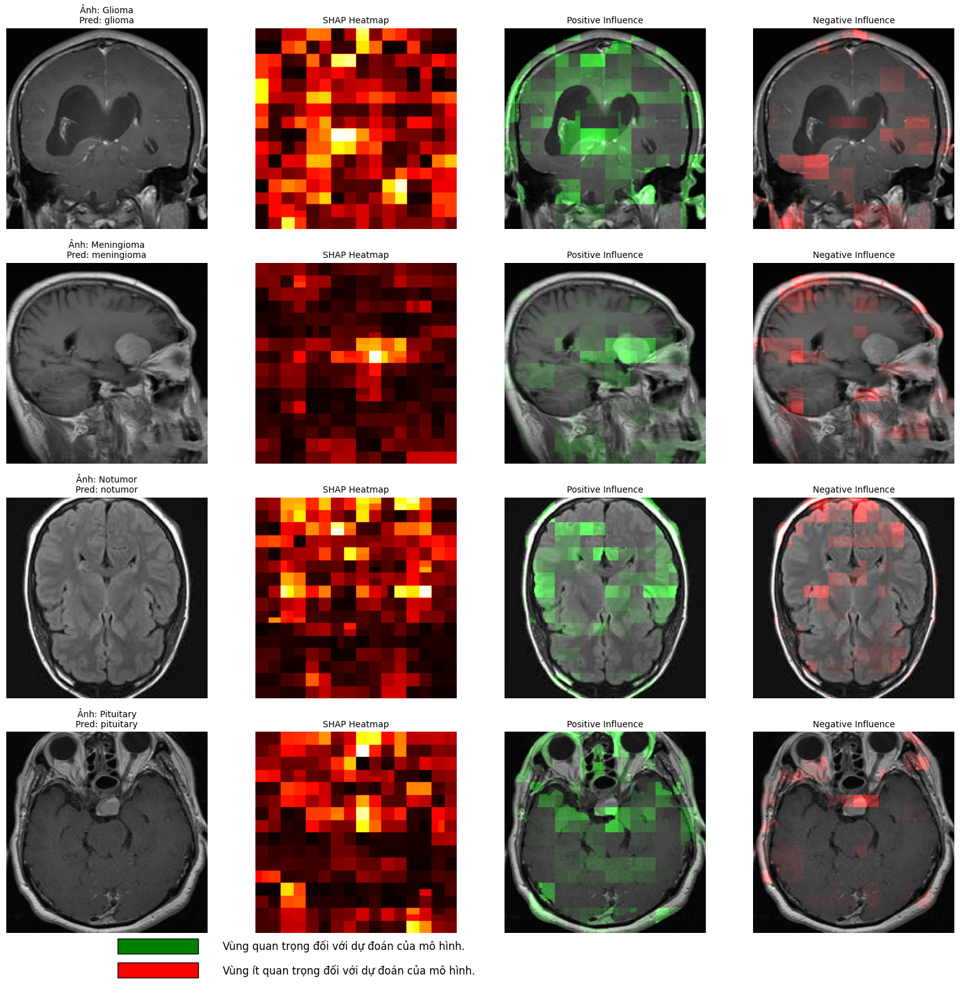

In [8]:
import os
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import shap
import cv2
from transformers import ViTForImageClassification, AutoImageProcessor, ViTConfig
from skimage.segmentation import slic
from skimage.color import label2rgb
import torch.nn as nn
from torchvision import transforms
import torch.nn.functional as F
import matplotlib.patches as patches

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Tạo thư mục lưu kết quả
save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/vit/results"
os.makedirs(save_dir, exist_ok=True)

# Khởi tạo transform chuẩn
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Load model
MODEL_NAME = "google/vit-base-patch16-224"
model = ViTForImageClassification.from_pretrained(
    MODEL_NAME,
    num_labels=4,
    ignore_mismatched_sizes=True
)

# Định nghĩa lại classifier
model.classifier = nn.Sequential(
    nn.Dropout(0.3),
    nn.Linear(model.config.hidden_size, model.config.num_labels)
)

# Tải state_dict
model_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"
try:
    state_dict = torch.load(model_path, map_location=device, weights_only=True)
    # Adjust state_dict keys if necessary (remove 'module.' prefix if present)
    state_dict_no_module = {}
    for key, value in state_dict.items():
        new_key = key.replace('module.', '')
        if new_key == "classifier.weight":
            state_dict_no_module["classifier.0.weight"] = value
        elif new_key == "classifier.bias":
            state_dict_no_module["classifier.0.bias"] = value
        else:
            state_dict_no_module[new_key] = value
    model.load_state_dict(state_dict_no_module, strict=True)
    print("✅ Mô hình đã được tải thành công!")
except Exception as e:
    print(f"❌ Lỗi khi tải mô hình: {e}")
    exit(1)

# Chuyển mô hình sang thiết bị và đặt chế độ eval
model.to(device)
model.eval()

# Định nghĩa nhãn lớp khối u não
class_labels = ["glioma", "meningioma", "notumor", "pituitary"]
num_classes = len(class_labels)

# Hàm cắt rìa ảnh
def crop_image(img_array, margin=20):
    """Cắt bỏ rìa ảnh để loại bỏ vùng không liên quan."""
    height, width = img_array.shape[:2]
    return img_array[margin:height-margin, margin:width-margin]

# Hàm tiền xử lý ảnh
def preprocess_image(image_path):
    if not os.path.exists(image_path):
        print(f"Error: File {image_path} does not exist")
        return None, None, None
    try:
        image = Image.open(image_path).convert("RGB")
        # Resize trước khi cắt
        image = image.resize((224, 224), Image.LANCZOS)
        img_array = np.array(image)
        # Cắt rìa
        img_array = crop_image(img_array, margin=20)
        image = Image.fromarray(img_array)
        input_tensor = transform(image).unsqueeze(0).to(device)
        return image, input_tensor, img_array
    except Exception as e:
        print(f"Error loading image {image_path}: {str(e)}")
        return None, None, None

# Hàm dự đoán
def predict_single_image(image_path, model):
    image, input_tensor, _ = preprocess_image(image_path)
    if image is None or input_tensor is None:
        return None, 0

    try:
        with torch.no_grad():
            outputs = model(input_tensor)
            logits = outputs.logits
            probs = F.softmax(logits, dim=-1)
            predicted_class = torch.argmax(probs, dim=-1).item()
            confidence = probs[0][predicted_class].item() * 100

        predicted_label = class_labels[predicted_class]

        return predicted_label, confidence

    except Exception as e:
        print(f"Error processing image {image_path}: {str(e)}")
        return None, 0

# Khởi tạo mô hình và tham số
def initialize_model_and_params(save_dir=None, device=None, processor=None, model=None, model_path=None):
    if save_dir is not None:
        os.makedirs(save_dir, exist_ok=True)

    if device is None:
        device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

    if processor is None:
        processor = AutoImageProcessor.from_pretrained(MODEL_NAME)

    if model is None:
        global_model = globals().get('model')
        if global_model is not None:
            model = global_model.to(device)
        else:
            raise ValueError("No global model found and no model provided!")
    else:
        model.to(device)

    return save_dir, device, processor, model

# Phân vùng ảnh
def segment_image(image, n_segments=1500, compactness=20):
    if isinstance(image, str):
        image = np.array(Image.open(image).convert("RGB"))
    elif isinstance(image, Image.Image):
        image = np.array(image)

    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)

    segments = slic(
        image,
        n_segments=n_segments,
        compactness=compactness,
        sigma=1.0,
        start_label=1,
        enforce_connectivity=True,
        min_size_factor=0.01
    )
    return segments

# Wrapper cho mô hình ViT
class ViTWrapper:
    def __init__(self, model, processor, device, num_classes):
        self.model = model
        self.processor = processor
        self.device = device
        self.num_classes = num_classes
        self.model.eval()

    def __call__(self, images):
        if isinstance(images, np.ndarray) and len(images.shape) == 3:
            images = [images]

        batch_probs = []
        for img in images:
            img_pil = Image.fromarray(np.uint8(img)) if isinstance(img, np.ndarray) else img
            inputs = self.processor(images=img_pil, return_tensors="pt").to(self.device)

            with torch.no_grad():
                outputs = self.model(**inputs).logits
                probs = torch.nn.functional.softmax(outputs, dim=1).cpu().numpy()[0]
                if probs.shape[0] != self.num_classes:
                    raise ValueError(f"Đầu ra mô hình có {probs.shape[0]} lớp, nhưng kỳ vọng {self.num_classes}")
                batch_probs.append(probs)

        return np.array(batch_probs)

# Hàm giải thích bằng SHAP
def explain_with_shap(image_path, n_segments=150, n_background=10, save_dir=None, device=None, processor=None, model=None, model_path=None):
    save_dir, device, processor, model = initialize_model_and_params(save_dir, device, processor, model, model_path)
    model.to(device).eval()

    # Tiền xử lý ảnh
    image, input_tensor, img_array = preprocess_image(image_path)
    if image is None or input_tensor is None:
        raise ValueError("Không thể tiền xử lý ảnh, dừng quá trình SHAP.")

    # Dự đoán nhãn và độ tin cậy
    predicted_label, prediction_confidence = predict_single_image(image_path, model)
    if predicted_label is None:
        raise ValueError("Không thể dự đoán ảnh, dừng quá trình SHAP.")

    predicted_class = class_labels.index(predicted_label)

    segments = segment_image(img_array, n_segments=n_segments)

    model_wrapper = ViTWrapper(model, processor, device, num_classes)

    background = np.zeros((n_background, *img_array.shape), dtype=np.uint8)
    for i in range(n_background):
        background[i] = np.random.randint(0, 20, size=img_array.shape, dtype=np.uint8)

    masker = shap.maskers.Image("inpaint_telea", img_array.shape)
    explainer = shap.Explainer(model_wrapper, masker, output_names=class_labels, background=background)
    
    # Tăng max_evals để giảm nhiễu
    shap_values = explainer(np.array([img_array]), max_evals=5000, batch_size=32)

    print(f"Shape giá trị SHAP: {shap_values.values.shape}")

    if len(shap_values.values.shape) == 5:
        num_classes_detected = shap_values.values.shape[3]
        if num_classes_detected != num_classes:
            shap_values.values = np.sum(shap_values.values, axis=3)
            print(f"Đã điều chỉnh shape giá trị SHAP: {shap_values.values.shape}")
            if shap_values.values.shape[3] != num_classes:
                raise ValueError(f"Giá trị SHAP đã điều chỉnh có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    if shap_values.values.shape[3] != num_classes:
        raise ValueError(f"Giá trị SHAP có {shap_values.values.shape[3]} lớp, nhưng kỳ vọng {num_classes}")

    shap_values_class = shap_values.values[0, :, :, predicted_class]
    
    # Lọc SHAP values để giảm nhiễu
    shap_pos = np.maximum(shap_values_class, 0)
    shap_neg = np.maximum(-shap_values_class, 0)

    # Tạo mask dựa trên segments để tập trung vào vùng não
    brain_mask = np.zeros_like(segments, dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        # Giả định các đoạn có cường độ cao là vùng não
        if np.mean(img_array[mask]) > 50:  # Ngưỡng điều chỉnh nếu cần
            brain_mask[mask] = 1

    # Đảm bảo brain_mask khớp kích thước với shap_values
    if brain_mask.shape != shap_values_class.shape:
        brain_mask = cv2.resize(brain_mask, (shap_values_class.shape[1], shap_values_class.shape[0]), interpolation=cv2.INTER_NEAREST)

    shap_pos = shap_pos * brain_mask
    shap_neg = shap_neg * brain_mask

    threshold = 0.0001
    shap_pos_norm = np.zeros_like(shap_pos)
    shap_neg_norm = np.zeros_like(shap_neg)

    pos_max = shap_pos.max()
    if pos_max > 0:
        shap_pos_norm = shap_pos / pos_max
        shap_pos_norm[shap_pos_norm < threshold] = 0

    neg_max = shap_neg.max()
    if neg_max > 0:
        shap_neg_norm = shap_neg / neg_max
        shap_neg_norm[shap_neg_norm < threshold] = 0

    print("Tổng giá trị SHAP tích cực:", shap_pos.sum())
    print("Tổng giá trị SHAP tiêu cực:", shap_neg.sum())

    shap_heatmap = np.abs(shap_values_class)
    shap_abs = shap_heatmap.copy()
    shap_min, shap_max = shap_abs.min(), shap_abs.max()
    if shap_max > shap_min:
        shap_abs = (shap_abs - shap_min) / (shap_max - shap_min)

    def create_colored_overlay(img, heatmap, color, alpha=0.7):
        heatmap_rgb = np.zeros((*heatmap.shape, 3), dtype=np.float32)
        for i in range(3):
            heatmap_rgb[:, :, i] = heatmap * color[i]
        heatmap_rgb = (heatmap_rgb * 255).astype(np.uint8)
        overlay = cv2.addWeighted(img.copy(), 1, heatmap_rgb, alpha, 0)
        return overlay

    pos_overlay = create_colored_overlay(img_array, shap_pos_norm, (0, 1, 0))  # Xanh lá
    neg_overlay = create_colored_overlay(img_array, shap_neg_norm, (1, 0, 0))  # Đỏ

    segment_map = np.zeros_like(segments, dtype=np.float32)
    for seg_id in np.unique(segments):
        mask = segments == seg_id
        segment_map[mask] = np.mean(shap_abs[mask])

    segment_overlay = label2rgb(segments, img_array, alpha=0.5, bg_label=0)

    if save_dir:
        plt.imsave(os.path.join(save_dir, "shap_heatmap.png"), shap_abs, cmap='hot')
        plt.imsave(os.path.join(save_dir, "positive_influence.png"), pos_overlay)
        plt.imsave(os.path.join(save_dir, "negative_influence.png"), neg_overlay)
        plt.imsave(os.path.join(save_dir, "segment_overlay.png"), segment_overlay)

    results = {
        'original_image': img_array,
        'prediction': predicted_label,
        'confidence': prediction_confidence,
        'shap_heatmap': shap_abs,
        'positive_influence': pos_overlay,
        'negative_influence': neg_overlay,
        'segment_overlay': segment_overlay,
        'segments': segments
    }

    return results

# Hàm phân tích nhiều ảnh
def analyze_multiple_brain_mri(image_paths, n_segments=300, save_dir=None, model_path=None):
    results_list = []
    for image_path, true_label in image_paths:
        results = explain_with_shap(
            image_path=image_path,
            n_segments=n_segments,
            save_dir=save_dir,
            model_path=model_path
        )
        results_list.append((results, true_label))
        # print(f"Dự đoán: {results['prediction']} với độ tin cậy {results['confidence']:.2f}% (Nhãn thật: {true_label})")
    return results_list

# Hàm hiển thị kết quả
def visualize_multiple_shap_results(results_list, figsize=(16, 16)):
    plt.rcParams.update({'font.size': 10})
    fig, axes = plt.subplots(4, 4, figsize=figsize)

    for idx, (results, true_label) in enumerate(results_list):
        original_image = results['original_image']
        shap_heatmap_full = results['shap_heatmap']
        positive_influence_full = results['positive_influence']
        negative_influence_full = results['negative_influence']

        # Ảnh gốc
        axes[idx, 0].imshow(original_image)
        axes[idx, 0].set_title(f"Ảnh: {true_label}\nPred: {results['prediction']}", fontsize=10)
        axes[idx, 0].axis('off')

        # Bản đồ nhiệt SHAP
        axes[idx, 1].imshow(shap_heatmap_full, cmap='hot')
        axes[idx, 1].set_title(f"SHAP Heatmap", fontsize=10)
        axes[idx, 1].axis('off')

        # Ảnh hưởng tích cực (Xanh lá)
        axes[idx, 2].imshow(positive_influence_full)
        axes[idx, 2].set_title(f"Positive Influence", fontsize=10)
        axes[idx, 2].axis('off')

        # Ảnh hưởng tiêu cực (Đỏ)
        axes[idx, 3].imshow(negative_influence_full)
        axes[idx, 3].set_title(f"Negative Influence", fontsize=10)
        axes[idx, 3].axis('off')

    # Thêm ghi chú với ô màu
    note_ax = fig.add_axes([0.1, 0.01, 0.8, 0.06])
    note_ax.axis("off")

    green_rect = patches.Rectangle((0.05, 0.65), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='green', transform=note_ax.transAxes)
    note_ax.add_patch(green_rect)
    note_ax.text(0.18, 0.775, "Vùng quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)

    red_rect = patches.Rectangle((0.05, 0.25), 0.1, 0.25, linewidth=1, edgecolor='black', facecolor='red', transform=note_ax.transAxes)
    note_ax.add_patch(red_rect)
    note_ax.text(0.18, 0.375, "Vùng ít quan trọng đối với dự đoán của mô hình.", 
                 verticalalignment='center', fontsize=12, transform=note_ax.transAxes)

    plt.tight_layout(rect=[0, 0.06, 1, 1])
    plt.savefig(os.path.join(save_dir, "shap_results_4x4.png"), dpi=300, bbox_inches='tight')
    plt.show()

# Chạy phân tích
if __name__ == "__main__":
    image_paths = [
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/glioma/Te-gl_0154.jpg", "Glioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/meningioma/Te-me_0219.jpg", "Meningioma"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/notumor/Te-no_0244.jpg", "Notumor"),
        ("/kaggle/input/brain-tumor-mri-dataset/Testing/pituitary/Te-pi_0027.jpg", "Pituitary"),
    ]
    save_dir = "/content/drive/MyDrive/Colab Notebooks/chatluongcao/vit/results"
    model_path = "/kaggle/input/vit/pytorch/default/2/vit_model_best_acc.pth"
    results_list = analyze_multiple_brain_mri(image_paths, n_segments=300, save_dir=save_dir, model_path=model_path)
    visualize_multiple_shap_results(results_list)

In [2]:
!pip install scikit-fuzzy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 920.8/920.8 kB 28.2 MB/s eta 0:00:00


In [3]:
import os
import torch
from torch.utils.data import DataLoader
from transformers import ViTImageProcessor, ViTForImageClassification
from torchvision import datasets, transforms
import numpy as np
import skfuzzy as fuzz
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from tqdm import tqdm
from PIL import Image
import glob
from scipy.stats import mode

# Đường dẫn đến file .pth của bạn
model_pth_path = "/kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth"  # Thay đổi đường dẫn này thành đường dẫn thực tế của bạn

# Thiết lập thiết bị
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Sử dụng thiết bị: {device}")

# Định nghĩa transform cho dữ liệu
data_dir = "/kaggle/input/brain-tumor-mri-dataset"
val_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Tải tập dữ liệu test
test_dataset = datasets.ImageFolder(os.path.join(data_dir, "Testing"), transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)
print(f"📊 Số lượng ảnh test: {len(test_dataset)}")
print(f"Danh sách lớp: {test_dataset.classes}")

# Lưu danh sách các nhãn bệnh
disease_labels = test_dataset.classes  # ['glioma', 'meningioma', 'notumor', 'pituitary']

# Khởi tạo mô hình ViT
model_name = "google/vit-base-patch16-224"
processor = ViTImageProcessor.from_pretrained(model_name)
model = ViTForImageClassification.from_pretrained(
    model_name,
    num_labels=len(test_dataset.classes),
    ignore_mismatched_sizes=True
)
model.classifier = torch.nn.Sequential(
    torch.nn.Dropout(0.3),
    torch.nn.Linear(model.classifier.in_features, model.classifier.out_features)
)
model.to(device)
model.eval()

# Tải trọng số mô hình từ đường dẫn .pth được cung cấp
try:
    model.load_state_dict(torch.load(model_pth_path, map_location=device))
    print(f"✅ Đã tải trọng số mô hình từ: {model_pth_path}")
except Exception as e:
    print(f"❌ Lỗi khi tải trọng số mô hình: {e}")
    raise

# Trích xuất đặc trưng từ ViT
features = []
labels = []
with torch.no_grad():
    for images, lbls in tqdm(test_loader, desc="Trích xuất đặc trưng"):
        images = images.to(device)
        outputs = model.vit(images).last_hidden_state[:, 0, :]  # Lấy [CLS] token
        features.append(outputs.cpu().numpy())
        labels.append(lbls.numpy())
features = np.concatenate(features, axis=0)
labels = np.concatenate(labels, axis=0)
print(f"Kích thước đặc trưng: {features.shape}")

# Giảm chiều đặc trưng xuống 3D bằng PCA
pca = PCA(n_components=3)
features_3d = pca.fit_transform(features)
print(f"Kích thước đặc trưng sau PCA: {features_3d.shape}")

# Áp dụng FCM
n_clusters = 4  # Số cụm tương ứng với số lớp
cntr, u, u0, d, jm, p, fpc = fuzz.cluster.cmeans(
    features_3d.T, c=n_clusters, m=2, error=0.005, maxiter=1000, init=None
)

# Gán nhãn cụm dựa trên mức độ thuộc cao nhất
cluster_labels = np.argmax(u, axis=0)

# Ánh xạ nhãn cụm với nhãn bệnh (dựa trên majority voting)
cluster_to_disease = {}
for cluster in range(n_clusters):
    # Lấy nhãn thực tế của các điểm thuộc cụm này
    indices = np.where(cluster_labels == cluster)[0]
    true_labels_in_cluster = labels[indices]
    # Tìm nhãn bệnh xuất hiện nhiều nhất trong cụm
    most_common_label = mode(true_labels_in_cluster, axis=None)[0]
    cluster_to_disease[cluster] = disease_labels[most_common_label]
print("Ánh xạ cụm với nhãn bệnh:", cluster_to_disease)

# Tạo thư mục tạm để lưu các khung hình cho GIF
if not os.path.exists('temp_frames'):
    os.makedirs('temp_frames')

# Tạo các khung hình cho GIF và lưu hình tĩnh PNG
num_frames = 60  # Số khung hình cho GIF
colors = ['purple', 'blue', 'cyan', 'yellow']  # Màu sắc cho từng cụm

# Tạo hình tĩnh PNG
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
for i in range(n_clusters):
    cluster_points = features_3d[cluster_labels == i]
    ax.scatter(
        cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
        c=colors[i], alpha=0.6, s=30, label=cluster_to_disease[i]
    )
ax.set_xlabel('')
ax.set_ylabel('')
ax.set_zlabel('')
ax.set_title('FCM Clusters Visualization (3D)')
ax.set_xticklabels([])
ax.set_yticklabels([])
ax.set_zticklabels([])
ax.legend()
plt.savefig('fcm_3d_clustering.png')
plt.close()
print(f"📊 Hình tĩnh được lưu tại 'fcm_3d_clustering.png'")

# Tạo các khung hình cho GIF
for frame in range(num_frames):
    fig = plt.figure(figsize=(8, 6))
    ax = fig.add_subplot(111, projection='3d')
    for i in range(n_clusters):
        cluster_points = features_3d[cluster_labels == i]
        ax.scatter(
            cluster_points[:, 0], cluster_points[:, 1], cluster_points[:, 2],
            c=colors[i], alpha=0.6, s=30, label=cluster_to_disease[i]
        )
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_zlabel('')
    ax.set_title('FCM Clusters Visualization (3D)')
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.set_zticklabels([])
    ax.legend()
    ax.view_init(elev=30, azim=frame * 360 / num_frames)
    plt.savefig(f'temp_frames/frame_{frame:03d}.png')
    plt.close()

# Tạo GIF từ các khung hình
frames = []
for frame_file in sorted(glob.glob('temp_frames/frame_*.png')):
    frames.append(Image.open(frame_file))
frames[0].save(
    'fcm_3d_clustering.gif',
    save_all=True,
    append_images=frames[1:],
    duration=100,
    loop=0
)

# Xóa thư mục tạm
import shutil
shutil.rmtree('temp_frames')
print("🗑️ Đã xóa thư mục tạm 'temp_frames'")

# Lưu kết quả phân cụm
np.save('fcm_cluster_labels.npy', cluster_labels)
np.save('fcm_centroids.npy', cntr)
print("✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels.npy' và 'fcm_centroids.npy'")
print(f"📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering.gif'")

2025-05-29 10:56:13.925203: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1748516174.111475      35 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1748516174.164680      35 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


Sử dụng thiết bị: cuda
📊 Số lượng ảnh test: 1311
Danh sách lớp: ['glioma', 'meningioma', 'notumor', 'pituitary']


preprocessor_config.json:   0%|          | 0.00/160 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/69.7k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Some weights of ViTForImageClassification were not initialized from the model checkpoint at google/vit-base-patch16-224 and are newly initialized because the shapes did not match:
- classifier.bias: found shape torch.Size([1000]) in the checkpoint and torch.Size([4]) in the model instantiated
- classifier.weight: found shape torch.Size([1000, 768]) in the checkpoint and torch.Size([4, 768]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


✅ Đã tải trọng số mô hình từ: /kaggle/input/vit/pytorch/default/1/vit_model_best_acc.pth


Trích xuất đặc trưng: 100%|██████████| 82/82 [00:25<00:00,  3.27it/s]


Kích thước đặc trưng: (1311, 768)
Kích thước đặc trưng sau PCA: (1311, 3)
Ánh xạ cụm với nhãn bệnh: {0: 'notumor', 1: 'pituitary', 2: 'glioma', 3: 'meningioma'}
📊 Hình tĩnh được lưu tại 'fcm_3d_clustering.png'
🗑️ Đã xóa thư mục tạm 'temp_frames'
✅ Kết quả phân cụm đã được lưu vào 'fcm_cluster_labels.npy' và 'fcm_centroids.npy'
📊 GIF trực quan hóa được lưu tại 'fcm_3d_clustering.gif'


In [4]:
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

ari = adjusted_rand_score(labels, cluster_labels)
nmi = normalized_mutual_info_score(labels, cluster_labels)
print(f"🎯 ARI: {ari:.3f} | NMI: {nmi:.3f}")


🎯 ARI: 0.968 | NMI: 0.948


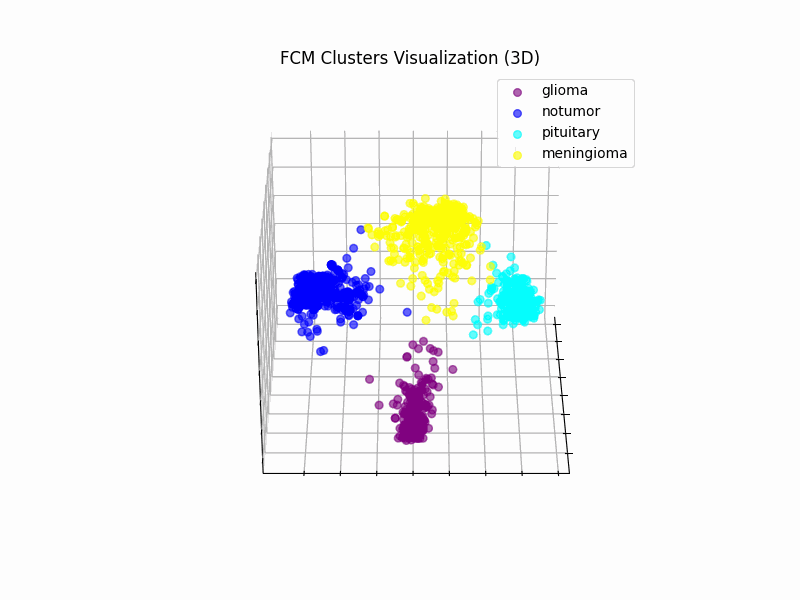

In [19]:
from IPython.display import Image
Image(filename='fcm_3d_clustering.gif')